In [ ]:
import sys
import os
sys.path.append("fypv3") 
import importlib
# import src

In [ ]:
os.path.abspath("/")

'/'

In [ ]:
import numpy as np
import torch
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from torch.optim import Adam
import matplotlib.cm as cm


import math
from IPython.display import display
import yfinance as yf

import matplotlib.pyplot as plt
from tqdm import tqdm 
import torch
import torch.nn as nn
import torch.nn.functional as F


In [ ]:
import src
try: 
    for module in [src.models, src.data, src.utils, src.train, src.verification, src.visualisation, src.evaluation]:
        if module:
            importlib.reload(module)
    print("Reloading")
except:
    print("Not reloading")

from src.models import *
from src.data import *
from src.utils import *
from src.train import *
from src.verification import *
from src.visualisation import *
from src.evaluation import *

Reloading


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [ ]:
# trainval_start = "2006-04-02"
# trainval_end = "2019-12-31"
# test_start = "2020-01-01"
# test_end = "2022-12-31"

# lookback = 50




In [ ]:
returns_df, close_df =  get_asset_dataset(trainval_start, test_end)

asset_names = list(returns_df.columns)
n_assets = len(asset_names)

[*********************100%***********************]  3 of 3 completed


In [ ]:
returns_df

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2001-06-18,NaN,NaN,-0.006378,NaN
2001-06-19,NaN,NaN,0.002802,NaN
2001-06-20,NaN,NaN,0.010547,NaN
2001-06-21,NaN,NaN,0.008028,NaN
2001-06-22,NaN,NaN,-0.006371,NaN
...,...,...,...,...
2025-05-29,0.003692,-0.005201,0.003216,-0.006732
2025-05-30,0.002453,-0.007605,-0.000827,-0.031804
2025-06-02,-0.002628,0.021073,0.005105,-0.011309


In [ ]:
returns_df

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2006-04-04,0.001319,-0.005406,0.005790,-0.037165
2006-04-05,0.000710,0.006271,0.003684,-0.000898
2006-04-06,-0.000811,0.017864,-0.000459,0.028751
2006-04-07,-0.003343,-0.004490,-0.010712,0.070742
2006-04-10,-0.000915,0.018450,0.001315,-0.005710
...,...,...,...,...
2022-12-23,-0.003459,0.018272,0.005516,-0.050068
2022-12-27,-0.007247,0.008972,-0.004179,0.037374
2022-12-28,-0.001748,-0.011318,-0.012591,0.022633


In [ ]:
def indexes(df, start, end, lookback=50, horizon=5, no_gap=False):
    ts = pd.to_datetime(start)
    ls = pd.to_datetime(end)
    print(ls, end)
    first = df.index.get_indexer([ts], method="bfill")[0]
    last = df.index.get_indexer([ls], method="bfill")[0]
    if last == -1:
        print("H")
        last = len(df.index)
    
        # print(last)
    if not no_gap:
        print(no_gap)
        last-=lookback+horizon

    return range(max(first-lookback, 0), last)

In [ ]:
trainval_start = "2006-04-02"
trainval_end = "2019-12-31"
test_start = "2020-01-01"
test_end = "2022-12-31"
X_trainval = returns_df.iloc[indexes(returns_df, trainval_start, trainval_end)]
val_size = int(0.20 * len(X_trainval))
X_train = X_trainval[:-val_size]
X_val = X_trainval[-val_size:]
X_test = returns_df.iloc[indexes(returns_df, test_start, test_end)]

2019-12-31 00:00:00 2019-12-31
False
2022-12-31 00:00:00 2022-12-31
H
False


In [ ]:
indexes(returns_df, test_start, test_end)

2022-10-11 00:00:00 2022-10-11 00:00:00


range(3310, 4104)

2019-12-31 00:00:00 2019-12-31
False
2022-12-31 00:00:00 2022-12-31
H
False


In [ ]:
test_end

Timestamp('2022-09-30 00:00:00')

In [ ]:
df

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2006-04-04,0.001319,-0.005406,0.005790,-0.037165
2006-04-05,0.000710,0.006271,0.003684,-0.000898
2006-04-06,-0.000811,0.017864,-0.000459,0.028751
2006-04-07,-0.003343,-0.004490,-0.010712,0.070742
2006-04-10,-0.000915,0.018450,0.001315,-0.005710
...,...,...,...,...
2022-12-23,-0.003459,0.018272,0.005516,-0.050068
2022-12-27,-0.007247,0.008972,-0.004179,0.037374
2022-12-28,-0.001748,-0.011318,-0.012591,0.022633


In [ ]:
X_test

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2019-08-08,0.000976,0.005427,0.019023,-0.132376
2019-08-09,-0.001330,0.008772,-0.007134,0.062685
2019-08-12,0.003639,-0.007358,-0.012355,0.173623
2019-08-13,-0.001415,0.023585,0.014278,-0.169275
2019-08-14,0.003101,-0.015142,-0.028891,0.261416
...,...,...,...,...
2022-09-26,-0.012860,-0.023324,-0.010963,0.078209
2022-09-27,-0.004273,0.010661,-0.001481,0.010539
2022-09-28,0.016119,0.027848,0.021047,-0.074233


In [ ]:
X_test

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2019-05-30,0.002646,-0.010191,0.001967,-0.033520
2019-05-31,0.004641,-0.026384,-0.013463,0.081503
2019-06-03,0.002361,-0.003305,-0.001990,0.008017
2019-06-04,-0.000906,0.005968,0.022434,-0.100212
2019-06-05,-0.000544,-0.020435,0.007662,-0.051856
...,...,...,...,...
2022-07-18,-0.003228,0.018748,-0.006909,0.044160
2022-07-19,-0.001374,0.003915,0.027932,-0.031621
2022-07-20,-0.000688,-0.000780,0.008091,-0.025306


In [ ]:
def create_windows(df, lookback=50, horizon=5):
    X, y = [], []
    index_list = []

    indices=df.index

    for i in range(len(indices) - lookback - horizon):
        # print(i)
        window_start = indices[i]
        input_end = indices[i + lookback]
        output_end = indices[i + lookback + horizon]

        x_window = df.loc[window_start:input_end].iloc[:-1].values  # shape: (lookback, features)
        y_window = df.loc[input_end:output_end].iloc[:horizon].values  # shape: (horizon, features)
        
        X.append(x_window)
        y.append(y_window)
        index_list.append(input_end)  # center timestamp for reference

    return torch.tensor(X, dtype=torch.float32), torch.tensor(y, dtype=torch.float32)

In [ ]:

# trainval_start = "2006-04-02"
# trainval_end = "2019-12-31"
# test_start = "2020-01-01"
# test_end = "2022-12-31"

# trainval_mask = (close_df.index >= trainval_start) & (close_df.index <= trainval_end)
# trainval_indices = close_df[trainval_mask].index
# val_size
# val_size = int(0.20 * len(trainval_indices))
# train_indices = trainval_indices[:-val_size]
# val_indices = trainval_indices[-val_size:]

# test_mask = (close_df.index >= test_start) & (close_df.index <= test_end)
# test_indices = close_df[test_mask].index

In [ ]:
# X_val = returns_df.iloc[window_indexes(returns_df, val_start, val_end)]

In [393]:
# returns_df[test_indices]

In [ ]:
X_test

Ticker,AGG,DBC,VTI,VIX
Date,,,,
2019-10-21,-0.002748,-0.001311,0.006531,-0.017544
2019-10-22,0.001512,0.001313,-0.003015,0.032857
2019-10-23,0.000799,0.012459,0.002038,-0.031120
2019-10-24,0.000266,0.005181,0.002756,-0.021413
2019-10-25,-0.001418,0.005799,0.003991,-0.077316
...,...,...,...,...
2022-12-23,-0.003459,0.018272,0.005516,-0.050068
2022-12-27,-0.007247,0.008972,-0.004179,0.037374
2022-12-28,-0.001748,-0.011318,-0.012591,0.022633


/tmp/ipykernel_1205081/2909350787.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


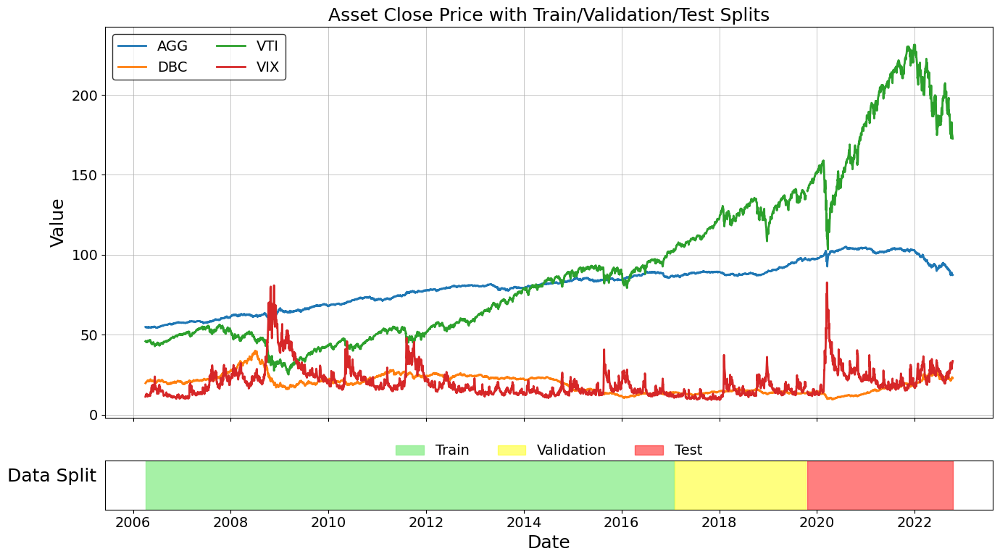

In [389]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np
colors = cm.get_cmap('tab10')

# -----------------------------------------------------------------------------
# ASSUMPTIONS:
#  - `close_df` is a pandas.DataFrame with a datetime-like index,
#    and columns corresponding to each ticker/asset.
#  - `train_indices`, `val_indices`, `test_indices` are each lists/arrays of
#    datetime-like index labels (e.g. pandas Timestamp) in `close_df.index` that define the three splits.
#  - `colors` is a colormap or function such that `colors(i)` returns a distinct color for asset i.
# -----------------------------------------------------------------------------

# Increase default font sizes for PDF readability
plt.rcParams.update({
    "font.size": 16,            # base font size for labels, ticks, legend text
    "axes.titlesize": 18,       # title font size
    "axes.labelsize": 18,       # x/y axis label font size
    "xtick.labelsize": 14,      # x-axis tick label font size
    "ytick.labelsize": 14,      # y-axis tick label font size
    "legend.fontsize": 14,      # legend text font size
})

# Compute start and end dates for each split
train_start = min(X_train.index)
train_end = max(X_train.index)
val_start = min(X_val.index)
val_end = max(X_val.index)
test_start = min(X_test.index)
test_end = max(X_test.index)

# Create subplots: main plot on top, timeline on bottom
fig, (ax_main, ax_timeline) = plt.subplots(
    2, 1, sharex=True,
    gridspec_kw={'height_ratios': [8, 1]},
    figsize=(14, 8)
)


for data, label in zip([X_train, X_val, X_test], ["Train", "Val", "Test"]):
    # 1) Plot each asset on the main axes
    for i, ticker in enumerate(data.columns):
        asset_color = colors(i)
        # Plot Train, Validation, Test segments: only label Train for legend
        
        # label = "Train"
        plot_label = ticker if label == "Train" else "_nolegend_"
        ax_main.plot(
            close_df.loc[data.index, ticker],
            color=asset_color,
            linewidth=2,
            label=plot_label
        )

ax_main.set_title("Asset Close Price with Train/Validation/Test Splits")
ax_main.set_ylabel("Value")
ax_main.grid(True, linewidth=0.5)
ax_main.legend(loc="upper left", fontsize="14", ncol=2, frameon=True, edgecolor="black")

# 2) Create the timeline: colored boxes for each split
#    We'll use ax_timeline.axvspan to draw colored regions at y=[0, 1] for each split.
ax_timeline.axvspan(train_start, train_end, color="lightgreen", alpha=0.8, label="Train")
ax_timeline.axvspan(val_start, val_end, color="yellow", alpha=0.5, label="Validation")
ax_timeline.axvspan(test_start, test_end, color="red", alpha=0.5, label="Test")

# Remove y-axis details for timeline
ax_timeline.set_yticks([])
ax_timeline.set_ylabel("Data Split", rotation=0, labelpad=40)
ax_timeline.yaxis.set_label_coords(-0.06, 0.5)
ax_timeline.grid(False)

# Format x-axis as dates
ax_timeline.xaxis.set_major_locator(mdates.AutoDateLocator())
ax_timeline.xaxis.set_major_formatter(mdates.ConciseDateFormatter(mdates.AutoDateLocator()))

# Add legend for the timeline in the timeline subplot
ax_timeline.legend(loc="center", ncol=3, frameon=False, bbox_to_anchor=(0.5, 1.2))

plt.xlabel("Date")
plt.tight_layout(h_pad=1.0)
plt.show()


In [ ]:
# lookback = 50   
# horizon = 5     
# allocation_step = 5

# X_train, y_train, train_idx = create_windows(returns_df, train_indices, lookback, horizon)
# X_val, y_val, val_idx = create_windows(returns_df, val_indices, lookback, horizon)
# X_test, y_test, test_idx = create_windows(returns_df, test_indices, lookback, horizon)

# batch_size = 28

# X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
# y_train_tensor = torch.tensor(y_train, dtype=torch.float32)

# X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
# y_val_tensor = torch.tensor(y_val, dtype=torch.float32)

# X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
# y_test_tensor = torch.tensor(y_test, dtype=torch.float32)

# num_samples, seq_len, num_assets = X_train_tensor.shape
# flattened = X_train_tensor.reshape(-1, num_assets)

# mean = flattened.mean(dim=0)  # shape (num_assets,)
# std = flattened.std(dim=0)    # shape (num_assets,)

# std[std == 0] = 1.0

# X_train_tensor = standardize(X_train_tensor, mean, std)
# X_val_tensor = standardize(X_val_tensor, mean, std)
# X_test_tensor = standardize(X_test_tensor, mean, std)

# saved_mean = mean
# saved_std = std

In [ ]:
# asset_std = X_train_tensor.reshape(-1, X_train_tensor.shape[-1]).std(dim=0)
X_train_tensor, y_train_tensor = create_windows(X_train)
X_val_tensor, y_val_tensor = create_windows(X_val)


batch_size = 28
sigma = 0.025
jitter = Jitter(sigma=sigma)

train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
# test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [276]:
# import numpy as np

# def compute_cumulative_return(x, Tr):
#     """
#     Same shape assumptions as before:
#       x is a (n × T) array of daily net returns,
#       Tr divides T exactly (here T = 3*Tr).
#     We rebalance to equal‐weight on every block‐start.
#     """

#     n, T = x.shape
#     # assert T % Tr == 0, "T must be a multiple of Tr"
#     K = math.ceil(T / Tr) 

#     cr = 1.0        # running gross product
#     weight_end = None  # will hold w_{i, t-1} once t>0
#     crs = []
#     for k in range(K):
#         for j in range(Tr):
#             t = k * Tr + j

#             if t >= T:
#                 break

#             # 1) Determine weight at the *start* of day t
#             if j == 0:
#                 # Rebalance to equal‐weight at the start of each block
#                 # (so weight_begin is [1/n,...,1/n])
#                 # weight_begin = np.array([0.4, 0.1, 0.4, 0.1])#np.array([1.0 / n] * n)
#                 weight_begin = np.array([1.0 / n] * n)
#             else:
#                 # Otherwise, carry over yesterday’s “weight_end”
#                 weight_begin = weight_end.copy()

#             # 2) Compute the day‐t portfolio return using weight_begin
#             #    r_p_t = sum_i weight_begin[i] * x[i, t]
#             # r_p_t = np.dot(weight_begin, x[:, t])

#             # 3) Update the cumulative gross product
#             cr *= (1.0 + r_p_t)
#             crs.append(cr)

#             # 4) Now compute post‐return (end‐of‐day) weights for use tomorrow
#             #    temp[i] = weight_begin[i] * (1 + x[i,t]); then normalize
#             temp = weight_begin * (1.0 + x[:, t])
#             weight_end = temp / np.sum(temp)
#     crs = np.array(crs) - 1
#     plt.figure()
#     plt.plot(crs)
#     plt.show()
#     # 5) Return net cumulative = (gross_product − 1)
#     return cr - 1.0,


# # ——— Quick sanity check with random data ———
# np.random.seed(0)
# # x = np.random.randn(4, 756) * 0.01   # 4 assets, 756 days of 1%-vol returns
# Tr = 252

# R_net = compute_cumulative_return(x, Tr)
# print("Net cumulative return:", R_net)


In [467]:
import numpy as np
import math

# def dummy_rebalance(past_returns):
#     """
#     Dummy placeholder: takes exactly h days of past returns (shape: n × h)
#     and returns a weight vector of length n that sums to 1.
#     """
#     n = past_returns.shape[0]



    
#     return np.array([1.0 / n] * n)


def compute_cumulative_return(x, Tr, h, model):
    """
    Compute net cumulative return with rebalancing every Tr days,
    using exactly h past returns to compute weights. We skip the first h days,
    since we can’t form a weight before seeing h returns.

    Args:
      x:   numpy array of shape (n, T) with daily returns.
      Tr:  integer rebalancing period.
      h:   lookback window (in days) for the rebalancer; must be <= T.
    Returns:
      Net cumulative return (float).
    """
    n, T = x.shape
    K = math.ceil(T / Tr)
    cr = 1.0
    weight_end = None

    crs = []
    rs = []
    weights = []
    for k in range(K):
        for j in range(Tr):
            t = k * Tr + j + h

            # print(h, t, x[:, t])
            # 0/0
            if t >= T:
                break

            # # If we haven’t yet observed h days, skip until t >= h
            # if t < h:
            #     continue

            # Determine if today is a rebalance day: (t - h) is multiple of Tr
            if (t - h) % Tr == 0:
                # We have exactly h days of past returns: indices [t-h .. t-1]
                past_returns = x[:, (t - h) : t]  # shape: (n, h)

                past_returns = torch.tensor(past_returns, dtype=torch.float, device="cuda")
                past_returns = past_returns.T.unsqueeze(0)
                weight_begin = model(past_returns).cpu().detach().numpy()
                # print(dummy_rebalance(past_returns))
                ##dummy_rebalance(past_returns)
            else:
                # Intra‐period drift: carry over yesterday’s end‐of‐day weights
                weight_begin = weight_end.copy()

            # 1) Compute that day’s portfolio return using weight_begin
            r_p_t = np.dot(weight_begin, x[:, t])
            

            # 2) Update the cumulative gross product
            cr *= (1.0 + r_p_t)
            # print(crs)
            crs.append(cr.item())
            rs.append(r_p_t.item())

            # 3) Drift weights to end‐of‐day for use tomorrow
            temp = weight_begin * (1.0 + x[:, t])
            weight_end = temp / np.sum(temp)

            weights.append(weight_end.copy())
        else:
            continue
        break
    # print(crs)

    weights = np.array(weights).squeeze(1)
    
    crs = np.array(crs) -1
    rs = np.array(rs)
    # print(crs)
    return crs, rs,weights


# # # —— Example Usage —— 
# # np.random.seed(0)
# # x = returns_df[(returns_df.index > "2020-01-01") & (returns_df.index <= "2030-01-01")].to_numpy().T
# #  # 4 assets, 760 days
# # Tr = 252   # rebalance every 252 days
# # h = 20     # need exactly 20 past days to rebalance

# # R_net = compute_cumulative_return(x, Tr, 50)
# # print("Net cumulative return:", R_net)
# h = 50
# start_date = pd.Timestamp("2020-01-01")
# end_date   = pd.Timestamp("2030-01-01")

# # 1) Find the first business day strictly after “2020-01-01”:
# mask_after = returns_df.index > start_date
# first_date_after = returns_df.index[mask_after][0]
# first_loc_after  = returns_df.index.get_loc(first_date_after)

# # 2) Find the last business day ≤ “2030-01-01”:
# mask_before = returns_df.index <= end_date
# last_date_le   = returns_df.index[mask_before][-1]
# last_loc_le    = returns_df.index.get_loc(last_date_le)

# # 3) Go back h business‐day rows from first_loc_after:
# prev_start_loc = max(0, first_loc_after - h)

# # 4) Now slice from prev_start_loc through last_loc_le (inclusive):
# x = returns_df.iloc[prev_start_loc : last_loc_le + 1].to_numpy().T

# compute_cumulative_return(x, Tr, h, model.to("cuda"))[-1]
# _

In [356]:
# model = experiments["seed=0 checkpoint=50"]["model"]

In [ ]:
# x = returns_df[(returns_df.index > "2020-01-01") & (returns_df.index <= "2030-01-01")].to_numpy().T

# Tr = 252
# print(x.shape)
# cr = 1
# for k in range(3):
#     for j in range(Tr):
#         t = k * Tr + j
#         if j == 0:
#             w_t = np.array([0.25]*4)
#             # w_t = np.array([0.4, 0.4, 0.1, 0.1])
#         else:
#             temp = w_t * (1 + x[:, t])
#             w_t = temp / temp.sum()

#         r = sum(w_t * x[:,t])

#         cr *= 1 +r
#     print(cr)

(4, 756)
2.138334861991297
3.579034961563426
4.999461414270027


In [ ]:
# len(y_test_tensor), 250*3

(752, 750)

In [ ]:
# model = UniformModel()
# T_r = 5
# T = 100
# # print(X_test_tensor.shape)

# # y = y_test_tensor[:750, 0:1, :].squeeze(1).T

    
# compute_cumulative_return(y, 252, equal_weight)

4 756


3.9994614142700273

In [ ]:
# def compute_cumulative_return(x, Tr, f):
#     """
#     Compute net cumulative return with rebalancing every Tr days,
#     using nested loops over k (period index) and j (day‐within‐period),
#     exactly matching the formula’s double product.

#     Args:
#       x:       list of length n, where x[i][t] is asset i’s return on day t (t=0..T-1).
#       Tr:      integer rebalancing period (number of days per block).
#       f:       function(past_returns) → list of new weights (length n, summing to 1).
#                past_returns is a list of length n, where each sublist has up to Tr entries.

#     Returns:
#       Net cumulative return (float), i.e. (∏_{t=0..T-1} [1 + r_p(t)]) – 1.
#     """
#     n = len(x)             # number of assets
#     T = len(x[0])          # total number of days
#     print(n,T)
#     assert T % Tr == 0, "T must be an integer multiple of Tr"
#     K = T // Tr            # number of rebalancing periods

#     # Initialize weight matrix w[i][t], i=0..n-1, t=0..T-1
#     w = [[0.0] * T for _ in range(n)]

#     cumulative = 1.0       # accumulation of ∏ (1 + r_p_t)

#     # Loop exactly as in the formula: for k=0..K-1, for j=1..Tr
#     for k in range(K):
#         for j in range(Tr):
#             # Convert (k, j) → zero-based day index t:
#             # In the formula, j runs 1..Tr, so here we do j_idx = j (0..Tr-1),
#             # then t = k*Tr + j_idx.
#             t = k * Tr + j

#             # 1) On the first day of each block (j == 0), we rebalance:
#             if j == 0:
#                 # Collect past Tr returns for each asset:
#                 # If t < Tr, take x[i][0:t]; else x[i][t-Tr : t].
#                 start_idx = max(0, t - Tr)
#                 past_returns = []
#                 for i in range(n):
#                     past_returns.append(x[i][start_idx:t])

#                 # Call optimizer f(...) to get new weights for day t
#                 new_w = f(past_returns)  # list of length n, sums to 1
#                 for i in range(n):
#                     w[i][t] = new_w[i]

#             else:
#                 # 2) Intra‐period drift: update w[i][t] from w[i][t-1] and x[i][t]
#                 numerator = [0.0] * n
#                 for i in range(n):
#                     numerator[i] = w[i][t - 1] * (1 + x[i][t])

#                 denom = sum(numerator)
#                 for i in range(n):
#                     w[i][t] = numerator[i] / denom

#             # 3) Compute that day's portfolio net return:
#             r_p_t = 0.0
#             for i in range(n):
#                 r_p_t += w[i][t] * x[i][t]

#             # 4) Multiply into cumulative gross return
#             cumulative *= (1 + r_p_t)

#     # 5) Subtract 1 to get net cumulative return
#     return cumulative - 1


# # Example “equal‐weight” rebalancer f(·)
# def equal_weight(past_returns):
#     n = len(past_returns)
#     return [0.25, 0.25, 0.25, 0.25]#[1.0 / n] * n


# # —— Example Usage —— 
# # Two assets, 6 days, Tr = 3
# x_example = [
#     [ 0.01,  -0.005,  0.02,    0.0,    0.015,  -0.01],  # asset 0
#     [ 0.005,  0.0,   -0.01,    0.02,  -0.005,   0.01]   # asset 1
# ]
# Tr_example = 3



## Experiments

In [ ]:
# import numpy as np

# def get_portfolio_value(model, data, rebalance_freq):
#     """
#     Returns:
#       - daily_total_values:  numpy array of shape (n_days,)
#       - daily_weights:       numpy array of shape (n_days, n_assets)
#       - daily_asset_values:  numpy array of shape (n_days, n_assets)
#     """
#     x, y = data[0], data[1].numpy()  
#     # x: whatever features go into your model; 
#     # y: numpy array of shape (n_days, n_assets) containing daily net returns per asset.

#     model.eval()
#     n_days, n_assets = y.shape
#     total_value = 1.0

#     all_daily_values = []   # will collect (period_length, n_assets) blocks
#     all_daily_weights = []  # will collect (period_length, n_assets) blocks

#     for t0 in range(0, n_days, rebalance_freq):
#         # 1) Get the new weights from the model at day t0
#         #    We assume model(x[t0:t0+1]) returns a tensor of shape (1, n_assets).
#         w_rb = model(x[t0:t0+1]).detach().cpu().numpy().flatten()  # shape: (n_assets,)

#         # 2) Starting asset dollar‐values at t0: 
#         #    each asset i gets total_value * w_rb[i].
#         asset_values = total_value * w_rb   # shape: (n_assets,)

#         # 3) Slice out the returns for this period (maybe shorter on the very last block)
#         t1 = min(t0 + rebalance_freq, n_days)
#         period_returns = y[t0:t1, :]       # shape: (period_length, n_assets)

#         # 4) Compute each day’s asset values in this block:
#         #    (start‐of‐block asset_values) * cumulative product of (1 + returns).
#         #    np.cumprod(…, axis=0) will have shape (period_length, n_assets).
#         daily_asset_vals = asset_values * np.cumprod(1 + period_returns, axis=0)

#         # 5) Compute each day’s total portfolio value and drifting weights:
#         #    daily_total = sum across assets
#         #    daily_weights = daily_asset_vals / daily_total[:, None]
#         daily_totals = daily_asset_vals.sum(axis=1, keepdims=False)           # shape: (period_length,)
#         daily_weights = daily_asset_vals / daily_totals[:, np.newaxis]        # shape: (period_length, n_assets)

#         # 6) Collect these
#         all_daily_values.append(daily_asset_vals)  
#         all_daily_weights.append(daily_weights)

#         # 7) Prepare for next rebalancing block: 
#         #    Last row of daily_asset_vals is end-of-block asset values.
#         asset_values = daily_asset_vals[-1, :]        # shape: (n_assets,)
#         total_value = asset_values.sum()              # scalar

#     # 8) Concatenate all blocks to get full n_days × n_assets arrays
#     all_daily_values = np.vstack(all_daily_values)   # shape: (n_days, n_assets)
#     all_daily_weights = np.vstack(all_daily_weights) # shape: (n_days, n_assets)

#     # 9) The user probably wants
#     #    - daily total portfolio value (sum across assets each day)
#     #    - daily drifting weights
#     #    - daily asset‐value breakdown
#     daily_total_values = all_daily_values.sum(axis=1)  # shape: (n_days,)

#     return daily_total_values, all_daily_weights, all_daily_values


In [110]:
# params_grids = [{
#     "seed": [0],
#     "epochs": [101],
#     "lambda_entropy": [0.025],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["CNN"],
#     "learning_rate": [1e-3],
#     "checkpoint_freq": [10],
#     "rebalance_freq": [5],
#     "jitter" : [1.5]
# }
# ]

# def dataset_fn(params):
#     jitter = Jitter(sigma=params.get("jitter", 0.025))
#     train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
#     val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

#     train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
#     val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
#     return train_loader, val_loader


# experiment_path = "/vol/bitbucket/jlt21/experiments/standard_model"
# # experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)
# experiments = {}
# # experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}
# # experiments["Fixed Baseline"] = {"model": FixedWeightModel(torch.tensor([0.4,0.4,0.1,0.1])), "params": {"label": "Fixed Baseline"}, "results": {}}
# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     # experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

In [111]:
asset_names

['AGG', 'DBC', 'VTI', 'VIX']

In [112]:
# # best_params = hyperparam_search(experiments)
# # filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
# filtered_experiements = experiments
# display_train_results(filtered_experiements)
# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

In [113]:
# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx, additional_detail=True)

In [ ]:
# def run_experiment(model, data, experiment={}):
#     params = experiment.get("params", {})
#     rebalance_freq = params.get("rebalance_freq", 252)
#     x, y = data
#     model.eval()
#     n = y.shape[0]

#     x = x.to(device)

#     portfolio_values,weights,holdings = get_portfolio_value(model, (x,y), rebalance_freq)

#     weights = torch.tensor(weights).squeeze(1)
#     holdings = torch.tensor(holdings).squeeze(1)


#     # returns = portfolio_values.
#     cum_returns = portfolio_values - 1

#     returns = (portfolio_values[1:] - portfolio_values[:-1]) / portfolio_values[:-1]

#     # Daily metrics
#     mean_return = np.mean(returns)
#     std_return = np.std(returns)
#     sharpe = sharpe_ratio(returns)

#     metrics = {
#         "expected_return": cum_returns[-1].item(),
#         "sharpe_ratio": sharpe,
#         "max_drawdown": max_drawdown(portfolio_values),
#         "mean_entropy": mean_entropy(weights),
#         "mean_return": mean_return,
#         "std_return": std_return,
#     }

#     raw = {
#         "weights": weights,
#         "returns": returns,
#         "cum_returns": cum_returns,
#         "holdings": holdings,
#     }

#     return {"metrics": metrics, "raw": raw}




In [532]:
def default_linestyle_map(params):
    return "-"

def display_train_results(experiments):
    plt.figure(figsize=(10, 6))
    colors = cm.get_cmap('tab10')

    for idx, (label, experiment) in enumerate(experiments.items()):
        if "train_results" not in experiment:
            continue
        # label = label_from_params(experiment["params"], experiments)
        
        data = experiment["train_results"]
        epochs = list(range(1, len(data["train_losses"]) + 1))
        color = colors(idx % 10) 

        plt.plot(epochs, data["train_losses"], label=f"{label} - Train", linestyle='-', color=color)
        plt.plot(epochs, data["val_losses"], label=f"{label} - Val", linestyle='--', color=color)

    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training and Validation Losses")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

def display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map=default_linestyle_map, label_from_params=None, additional_detail=False):
    metrics_df  = pd.DataFrame({k: v['results'][dataset_key]["metrics"] for k, v in experiments.items()}).T
    metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)
    display(metrics_df)

    plt.figure(figsize=(10, 6))
    for label, params, cr in [(k, v["params"], v['results'][dataset_key]["raw"]["cum_returns"]) for k, v in experiments.items()]:

        # print(cr.shape)

        plt.plot(range(cr.shape[0]), cr, label=label, linestyle=linestyle_map(params))

    plt.title(f"Cumulative Returns of Different Models ({dataset_key.title()})")
    plt.xlabel("Time Step")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    ncols = 2
    nrows = math.ceil(len(experiments.items()) / ncols)

    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
    axes = axes.flatten()

    # Loop through and plot
    for i, (label, weights) in enumerate([(k, v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]):
        ax = axes[i]
        ax.stackplot(range(cr.shape[0]), weights.T, labels=asset_names)
        ax.set_title(f'Stacked Area Plot of Asset Allocations ({label})')
        ax.set_xlabel('Time Step')
        ax.set_ylabel('Proportion')
        ax.legend(loc='upper left')
        ax.grid(True)

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    plt.show()

    if additional_detail:

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
        axes = axes.flatten()

        # Loop through and plot
        for i, (label, holding) in enumerate([(k, v['results'][dataset_key]["raw"]["holdings"]) for k, v in experiments.items()]):
            ax = axes[i]
            ax.plot(dataset_idx, holding.detach().numpy(), label=asset_names)
            ax.set_title(f'Stacked Area Plot of Asset Allocations ({label})')
            ax.set_xlabel('Time Step')
            ax.set_ylabel('Proportion')
            ax.legend(loc='upper left')
            ax.grid(True)

        # Hide any unused axes
        for j in range(i + 1, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(10, 6))

        for params, weights in [(k, v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]:
            if "epochs" not in params:
                continue
            plt.plot(dataset_idx, entropy(weights).detach().numpy(), label=label)

        plt.axhline(np.log(n_assets), color='gray', linestyle='--', label='Max Entropy (Uniform)')
        plt.title(f'Allocation Entropy Over Time ({dataset_key.title()})')
        plt.xlabel('Date')
        plt.ylabel('Entropy')
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

    return metrics_df    

# Standard Training

In [116]:
class PortfolioLSTMCell(nn.Module):
    def __init__(self, input_size=4, hidden_size=64, num_assets=4):
        super(PortfolioLSTMCell, self).__init__()
        self.hidden_size = hidden_size
        self.lstm_cell = nn.LSTMCell(input_size=input_size, hidden_size=hidden_size)
        self.fc = nn.Linear(hidden_size, num_assets)
    
    def forward(self, X):
        batch_size, seq_len, _ = X.size()
        h = torch.zeros(batch_size, self.hidden_size, device=X.device)
        c = torch.zeros(batch_size, self.hidden_size, device=X.device)
        for t in range(seq_len):
            h, c = self.lstm_cell(X[:, t, :], (h, c))
        raw_scores = self.fc(h)
        weights = F.softmax(raw_scores, dim=1)
        return weights

In [117]:
def loss_fn_fn(params):
    lambda_entropy = params["lambda_entropy"]
    def loss_fn(x, y, model, _):
        weights = model(x)

        asset_returns = ((1 + y).prod(1)-1)
        portfolio_returns = (asset_returns*weights).sum(1)
        natural_loss = -portfolio_returns.mean() 
        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())
        return natural_loss -  entropy_loss
    return loss_fn 
    

class LSTM(nn.Module):
    def __init__(self, input_size=4, hidden_size=64, num_layers=4, num_classes=4):
        super().__init__()
        self.hidden_size = hidden_size
        self.num_layers = num_layers

        self.lstm = nn.LSTM(
            input_size=input_size,
            hidden_size=hidden_size,
            num_layers=num_layers,
            batch_first=True,
        )
        # Now the FC only needs to map from hidden_size → num_classes
        self.fc = nn.Linear(hidden_size, num_classes)

    def forward(self, x):
        # x shape: (B, 50, 4)
        # out:    (B, 50, hidden_size)
        # h_n:    (num_layers, B, hidden_size)
        out, (h_n, c_n) = self.lstm(x)

        # Take the hidden state from the last LSTM layer:
        # h_n has shape (num_layers, B, hidden_size), so we pick h_n[-1]
        last_hidden = h_n[-1]               # shape: (B, hidden_size)

        # Pass through the FC layer to get class logits:
        logits = self.fc(last_hidden)       # shape: (B, num_classes)
        return torch.softmax(logits, dim=1)

def standard_model_fn(params):
    if params["model"] == "CNN":
        return CNNAllocatorCausal(4, lookback).to(device)
    elif params["model"] == "MLP":
        return SimpleAssetAllocationModel(4*lookback).to(device)
    elif params["model"] == "LSTM":
        hidden_size = params["lstm_hidden_layers"]
        num_layers = params["lstm_hidden_layers"]
        return LSTM(n_assets, hidden_size, num_layers, n_assets).to(device)
    elif params["model"] == "LSTM_Unrolled":
        hidden_size = params["lstm_hidden_size"]
        # num_layers = params["lstm_hidden_layers"]
        return PortfolioLSTMCell(n_assets, hidden_size, n_assets).to(device)
    elif params["model"] == "Transformer":
        return Transformer(input_size=50,  output_size=4, d_model=4, nhead=2, num_layers=2, dim_head=16).to(device)

    raise Exception("Model not found")

In [118]:
# model = CNNAllocatorCausal(4, lookback)



## CNN - Hyperparameter tuning 

In [597]:
def hyperparam_search(experiments, metric="val_expected_return"):
    params_df = pd.DataFrame({k: v['params'] for k, v in experiments.items()}).T
    results_df = params_df
    for df_name in ["val", "test"]:
        df  = pd.DataFrame({k: v['results'][df_name]["metrics"] for k, v in experiments.items()}).T
        df = df.add_prefix(f'{df_name}_')
        results_df = pd.concat([results_df, df], axis=1)

    # metric = "val_expected_return"
    params = params_df.columns 
    group_by_params = [p for p in params if p!= "seed"]
    agg_results_df = results_df.groupby(group_by_params)[metric].apply(
        lambda x: x.mean() if x.notna().all() else np.nan
    ).reset_index().sort_values(metric, ascending=False).dropna().rename(columns={metric: f"mean_{metric}"})
    print("Hyperparam Search over seeds")
    display(agg_results_df)
    best_params = agg_results_df[group_by_params].iloc[0].to_dict()

    for col, val in best_params.items():
        results_df = results_df[results_df[col] == val]

    results_df = results_df.sort_values(metric, ascending=False)[params].iloc[0]
    return results_df.to_dict()


In [599]:
params_grids = [{
    "seed": [0,1,2],
    "epochs": [60],
    "lambda_entropy": [0.005, 0.01, 0.025],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [1e-3],
    "checkpoint_freq": [10],
    "rebalance_freq": [5],
    "gradient_clipping": [1],
    "jitter" : [0.03, 0.1, 0.25]
}
]

params_grids = [{
    "seed": [55],
    "epochs": [60],
    "lambda_entropy": [0.005],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["CNN"],
    "learning_rate": [1e-3],
    "checkpoint_freq": [10],
    "rebalance_freq": [5],
    "gradient_clipping": [1],
    "jitter" : [0.25]
}
]

# params_grids = [{
#     "seed": [0],
#     "epochs": [100],
#     "lambda_entropy": [0.025],
#     "model": ["LSTM"],
#     "lstm_hidden_layers" : [2],
#     "lstm_hidden_size": [64],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "checkpoint_freq": [10],
#     "jitter" : [1],
# }
# ]



# params_grids = [{
#     "seed": [0],
#     "epochs": [101],
#     "lambda_entropy": [0.025],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
#     "model": ["CNN"],
#     "learning_rate": [1e-3],
#     "checkpoint_freq": [10],
#     "rebalance_freq": [5],
#     "jitter" : [1.5]
# }
# ]

def dataset_fn(params):
    jitter = Jitter(sigma=params.get("jitter", 0.025))
    train_dataset = AugmentedTimeSeriesDataset(X_train_tensor, y_train_tensor, transform=jitter)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    return train_loader, val_loader


experiment_path = "/vol/bitbucket/jlt21/experiments/standard_model"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     # experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     # experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

None
[False, False, False, False, False, False]
Training seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25.pth


Epochs:  17%|██████████▌                                                    | 10/60 [00:03<00:18,  2.68ep/s, train_loss=-0.01164, val_loss=-0.0167111985]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=10.pth


Epochs:  33%|█████████████████████                                          | 20/60 [00:07<00:14,  2.73ep/s, train_loss=-0.01176, val_loss=-0.0175234790]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=20.pth


Epochs:  50%|███████████████████████████████▌                               | 30/60 [00:10<00:10,  2.74ep/s, train_loss=-0.01256, val_loss=-0.0196680455]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=30.pth


Epochs:  67%|██████████████████████████████████████████                     | 40/60 [00:13<00:07,  2.73ep/s, train_loss=-0.01372, val_loss=-0.0192811747]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=40.pth


Epochs:  83%|████████████████████████████████████████████████████▌          | 50/60 [00:17<00:03,  2.69ep/s, train_loss=-0.01332, val_loss=-0.0213691234]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=50.pth


Epochs: 100%|███████████████████████████████████████████████████████████████| 60/60 [00:20<00:00,  2.94ep/s, train_loss=-0.01388, val_loss=-0.0208936139]

Saving seed=55,epochs=60,lambda_entropy=0.005,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,gradient_clipping=1,jitter=0.25,checkpoint=60.pth


In [423]:
# experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline", "rebalance_freq": 252}, "results": {}}

/tmp/ipykernel_1610445/1463711844.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


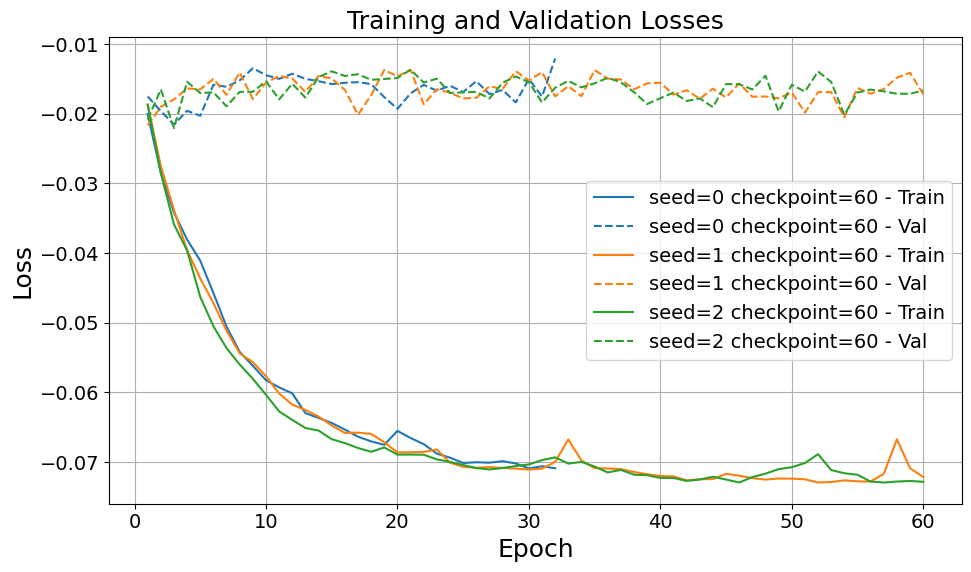

In [591]:
display_train_results({ ek: e for ek,e in experiments.items() if e["params"]["checkpoint"] == e["params"]["epochs"]})

In [ ]:
test_indices

DatetimeIndex(['2020-01-02', '2020-01-03', '2020-01-06', '2020-01-07',
               '2020-01-08', '2020-01-09', '2020-01-10', '2020-01-13',
               '2020-01-14', '2020-01-15',
               ...
               '2022-12-16', '2022-12-19', '2022-12-20', '2022-12-21',
               '2022-12-22', '2022-12-23', '2022-12-27', '2022-12-28',
               '2022-12-29', '2022-12-30'],
              dtype='datetime64[ns]', name='Date', length=756, freq=None)

In [ ]:
# def window_indexes(df, start, end, horizon=50):
#     # df = returns_df
#     ts = pd.to_datetime(start)
#     ls = pd.to_datetime(end)
#     first = df.index.get_indexer([ts], method="bfill")[0]
#     last = df.index.get_indexer([ls], method="bfill")[0]
#     first, last 
#     X = []
#     y = []

#     print(first, last)

#     print(last-50-5)



#     return range(max(first-50, 0), last-50-5)
#     # for i in range(first, last-horizon-5):
#     #     if i-horizon < 0:
#     #         continue
#     #     X.append(range(i-horizon,i))
#     #     y.append(range(i, i+5))
#     # return X, y

In [ ]:
# X_val = returns_df.iloc[window_indexes(returns_df, val_start, val_end)]

2768 3459
3404


In [ ]:
# val_indices

In [ ]:
# x_test = returns_df.loc[test_indices].to_numpy()
# x_val = returns_df.loc[val_indices].to_numpy()

In [ ]:
def calculate_results(dataset, experiment):
    model = experiment["model"]
    horizon = 50
    rebalance_freq = experiment["params"]["rebalance_freq"]
    crs, rs, weights = compute_cumulative_return(dataset.T, rebalance_freq, horizon, model)
    raw = {
        "weights": weights,
        "returns": rs,
        "cum_returns": crs,
    }
    metrics = {
            "expected_return": crs[-1].item(),
            "sharpe_ratio": sharpe_ratio(rs),    
    }
    return {"raw": raw, "metrics": metrics}


In [600]:
baseline = {"1/N": {"model": UniformModel(), "params": {"label": "Uniform Baseline", "rebalance_freq": 252}, "results": {}}}
all_experiments =  baseline

for dataset_name, dataset in zip(["val", "test"], [X_val, X_test]):
    dataset_np = dataset.to_numpy()
    for model_name, experiment in all_experiments.items():
        experiment["results"][dataset_name] = calculate_results(dataset_np, experiment)

In [601]:
best_params = best_CNN_params = hyperparam_search(experiments)
filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(filtered_experiements)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(filtered_experiements | baseline, dataset_key, dataset_idx )

KeyError: 'test'

In [537]:
params_df = pd.DataFrame({k: v['params'] for k, v in experiments.items()}).T
results_df = params_df
for df_name in ["val", "test"]:
    df  = pd.DataFrame({k: v['results'][df_name]["metrics"] for k, v in experiments.items()}).T
    df = df.add_prefix(f'{df_name}_')
    results_df = pd.concat([results_df, df], axis=1)

results_df.sort_values("val_expected_return", ascending=False)

,seed,epochs,lambda_entropy,model,learning_rate,checkpoint_freq,rebalance_freq,jitter,checkpoint,val_expected_return,val_sharpe_ratio,test_expected_return,test_sharpe_ratio
lambda_entropy=0.005 jitter=0.03 checkpoint=50,0,60,0.005,CNN,0.001,10,5,0.03,50,2.258467,0.063439,6.651462,0.076795
lambda_entropy=0.005 jitter=0.03 checkpoint=60,0,60,0.005,CNN,0.001,10,5,0.03,60,2.146894,0.058393,4.279687,0.063738
lambda_entropy=0.01 jitter=0.1 checkpoint=30,0,60,0.01,CNN,0.001,10,5,0.1,30,1.693772,0.054455,4.359422,0.066168
lambda_entropy=0.005 jitter=0.25 checkpoint=40,0,60,0.005,CNN,0.001,10,5,0.25,40,1.623346,0.052853,2.457455,0.055395
lambda_entropy=0.01 jitter=0.25 checkpoint=60,0,60,0.01,CNN,0.001,10,5,0.25,60,1.575541,0.052671,1.622024,0.049976
lambda_entropy=0.005 jitter=0.03 checkpoint=20,0,60,0.005,CNN,0.001,10,5,0.03,20,1.543304,0.052378,3.262305,0.059188
lambda_entropy=0.005 jitter=0.1 checkpoint=20,0,60,0.005,CNN,0.001,10,5,0.1,20,1.519107,0.052806,3.333867,0.059541
lambda_entropy=0.01 jitter=0.25 checkpoint=50,0,60,0.01,CNN,0.001,10,5,0.25,50,1.516929,0.052041,2.391727,0.056791
lambda_entropy=0.01 jitter=0.03 checkpoint=20,0,60,0.01,CNN,0.001,10,5,0.03,20,1.508862,0.054113,5.094985,0.073785
lambda_entropy=0.01 jitter=0.25 checkpoint=30,0,60,0.01,CNN,0.001,10,5,0.25,30,1.489447,0.055133,2.546451,0.061746


In [527]:
hyperparam_search(experiments, "test_expected_return")

Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,checkpoint_freq,rebalance_freq,jitter,checkpoint,mean_test_expected_return
4,60,0.005,CNN,0.001,10,5,0.03,50,6.651462
22,60,0.010,CNN,0.001,10,5,0.03,50,5.680284
21,60,0.010,CNN,0.001,10,5,0.03,40,5.550729
19,60,0.010,CNN,0.001,10,5,0.03,20,5.094985
20,60,0.010,CNN,0.001,10,5,0.03,30,4.876057
23,60,0.010,CNN,0.001,10,5,0.03,60,4.563863
47,60,0.025,CNN,0.001,10,5,0.10,60,4.432950
26,60,0.010,CNN,0.001,10,5,0.10,30,4.359422
5,60,0.005,CNN,0.001,10,5,0.03,60,4.279687
41,60,0.025,CNN,0.001,10,5,0.03,60,4.081330


{'seed': 0,
 'epochs': 60,
 'lambda_entropy': 0.005,
 'model': 'CNN',
 'learning_rate': 0.001,
 'checkpoint_freq': 10,
 'rebalance_freq': 5,
 'jitter': 0.03,
 'checkpoint': 50}

In [528]:
# display_train_results(experiments)

test


/tmp/ipykernel_1610445/537810219.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return
lambda_entropy=0.005 jitter=0.03 checkpoint=10,1.08
lambda_entropy=0.005 jitter=0.03 checkpoint=20,3.26
lambda_entropy=0.005 jitter=0.03 checkpoint=30,1.24
lambda_entropy=0.005 jitter=0.03 checkpoint=40,2.42
lambda_entropy=0.005 jitter=0.03 checkpoint=50,6.65
lambda_entropy=0.005 jitter=0.03 checkpoint=60,4.28
lambda_entropy=0.005 jitter=0.1 checkpoint=10,0.869
lambda_entropy=0.005 jitter=0.1 checkpoint=20,3.33
lambda_entropy=0.005 jitter=0.1 checkpoint=30,nan
lambda_entropy=0.005 jitter=0.1 checkpoint=40,nan


(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)
(757,)


/tmp/ipykernel_1610445/537810219.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


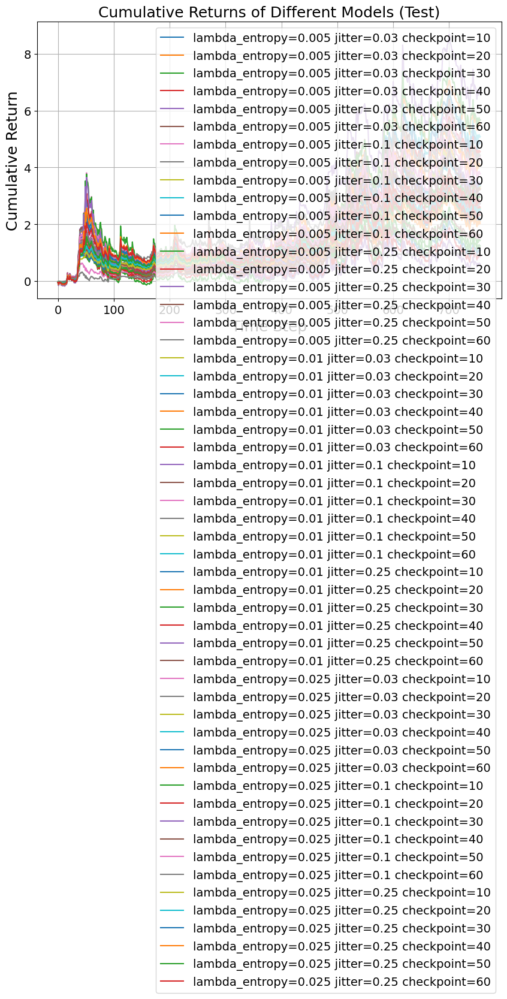

val


/tmp/ipykernel_1610445/537810219.py:4: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return
lambda_entropy=0.005 jitter=0.03 checkpoint=10,0.477
lambda_entropy=0.005 jitter=0.03 checkpoint=20,1.54
lambda_entropy=0.005 jitter=0.03 checkpoint=30,1.11
lambda_entropy=0.005 jitter=0.03 checkpoint=40,1.44
lambda_entropy=0.005 jitter=0.03 checkpoint=50,2.26
lambda_entropy=0.005 jitter=0.03 checkpoint=60,2.15
lambda_entropy=0.005 jitter=0.1 checkpoint=10,0.21
lambda_entropy=0.005 jitter=0.1 checkpoint=20,1.52
lambda_entropy=0.005 jitter=0.1 checkpoint=30,nan
lambda_entropy=0.005 jitter=0.1 checkpoint=40,nan


(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)
(631,)


/tmp/ipykernel_1610445/537810219.py:18: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


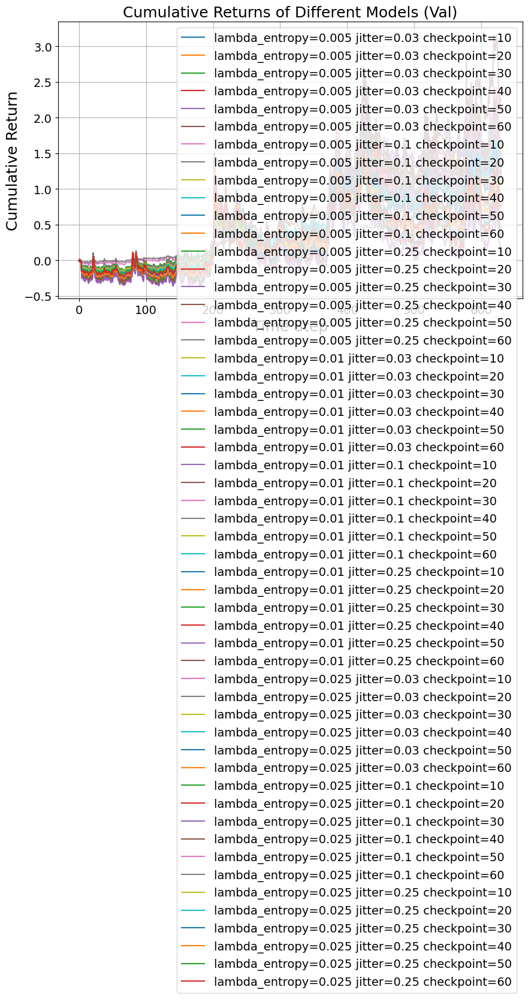

In [512]:
for dataset_key in ["test", "val"]:
    print(dataset_key)
    metrics_df  = pd.DataFrame({k: v['results'][dataset_key]["metrics"] for k, v in experiments.items()}).T
    metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)
    display(metrics_df)

    plt.figure(figsize=(10, 6))
    for label, params, cr in [(k, v["params"], v['results'][dataset_key]["raw"]["cum_returns"]) for k, v in experiments.items()]:

        print(cr.shape)
        plt.plot(cr, label=label)

    plt.title(f"Cumulative Returns of Different Models ({dataset_key.title()})")
    plt.xlabel("Time Step")
    plt.ylabel("Cumulative Return")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

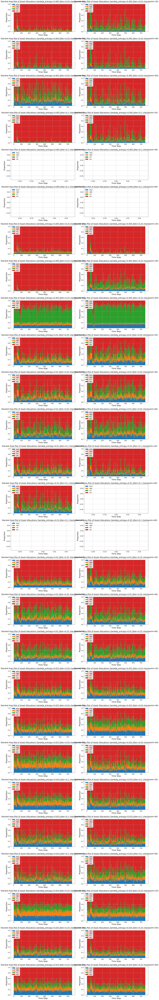

In [529]:
dataset_key = "test"
ncols = 2
nrows = math.ceil(len(experiments.items()) / ncols)

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10 * ncols, 5 * nrows))
axes = axes.flatten()

# Loop through and plot
for i, (label, weights) in enumerate([(k, v['results'][dataset_key]["raw"]["weights"]) for k, v in experiments.items()]):
    ax = axes[i]

    ax.stackplot(list(range(weights.shape[0])), (weights.T), labels=asset_names)
    # ax.stackplot(, labels=asset_names)
    ax.set_title(f'Stacked Area Plot of Asset Allocations ({label})')
    ax.set_xlabel('Time Step')
    ax.set_ylabel('Proportion')
    ax.legend(loc='upper left')
    ax.grid(True)
    

# Hide any unused axes
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


In [ ]:
# plt.figure()
for model_name, experiment in experiments.items():
    model = experiment["model"]

    crs, rs = compute_cumulative_return(x, experiment["params"]["rebalance_freq"], 50, model)

    
    # plt.plot(crs)
    
#     model = experiment["model"]
#     # experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     # experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


In [514]:
def hyperparam_search(experiments, metric="val_expected_return"):
    params_df = pd.DataFrame({k: v['params'] for k, v in experiments.items()}).T
    results_df = params_df
    for df_name in ["val", "test"]:
        df  = pd.DataFrame({k: v['results'][df_name]["metrics"] for k, v in experiments.items()}).T
        df = df.add_prefix(f'{df_name}_')
        results_df = pd.concat([results_df, df], axis=1)

    # metric = "val_expected_return"
    params = params_df.columns 
    group_by_params = [p for p in params if p!= "seed"]
    agg_results_df = results_df.groupby(group_by_params)[metric].mean().reset_index().sort_values(metric, ascending=False).dropna().rename(columns={metric: f"mean_{metric}"})
    print("Hyperparam Search over seeds")
    display(agg_results_df)
    best_params = agg_results_df[group_by_params].iloc[0].to_dict()

    for col, val in best_params.items():
        results_df = results_df[results_df[col] == val]

    results_df = results_df.sort_values(metric, ascending=False)[params].iloc[0]
    return results_df.to_dict()


Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,checkpoint_freq,rebalance_freq,jitter,checkpoint,mean_val_expected_return
5,101,0.025,CNN,0.001,10,5,1.5,60,1.779479
4,101,0.025,CNN,0.001,10,5,1.5,50,1.495938
2,101,0.025,CNN,0.001,10,5,1.5,30,1.441473
8,101,0.025,CNN,0.001,10,5,1.5,90,1.325141
6,101,0.025,CNN,0.001,10,5,1.5,70,1.212101
0,101,0.025,CNN,0.001,10,5,1.5,10,1.134406
3,101,0.025,CNN,0.001,10,5,1.5,40,1.122967
10,101,0.025,CNN,0.001,10,5,1.5,101,1.077576
1,101,0.025,CNN,0.001,10,5,1.5,20,1.047840
9,101,0.025,CNN,0.001,10,5,1.5,100,0.984386


/tmp/ipykernel_1610445/1405371290.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


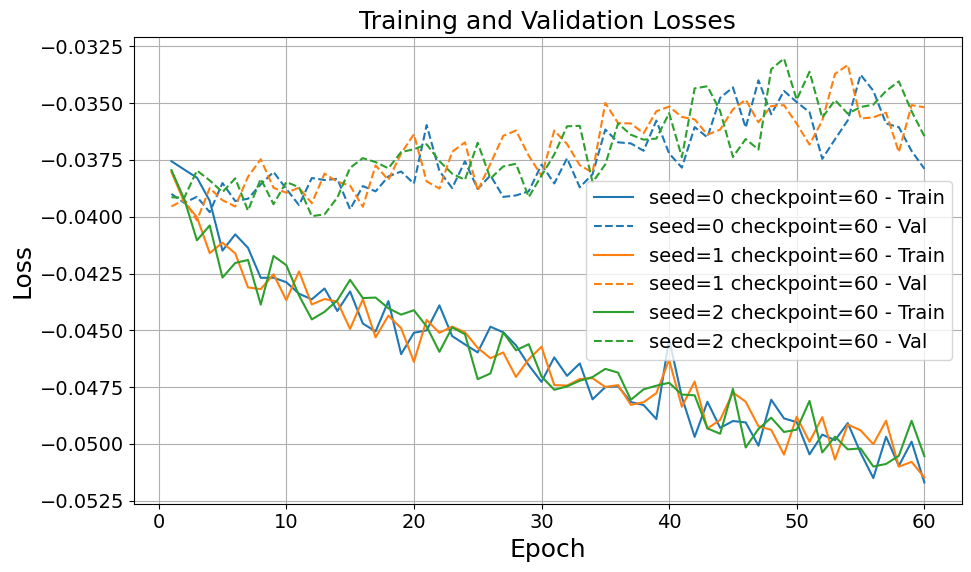

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=60,12.4,0.0932,0.471,1.07,0.00465,0.0499
seed=1 checkpoint=60,8.88,0.0933,0.325,1.13,0.00392,0.042
seed=2 checkpoint=60,10.3,0.0976,0.343,1.16,0.0041,0.0421


(752,)
(752,)
(752,)


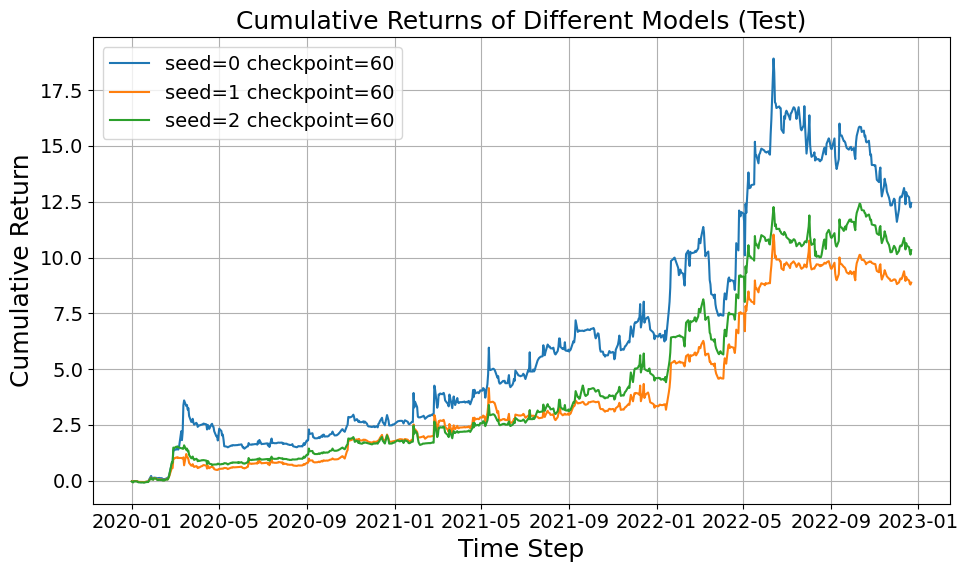

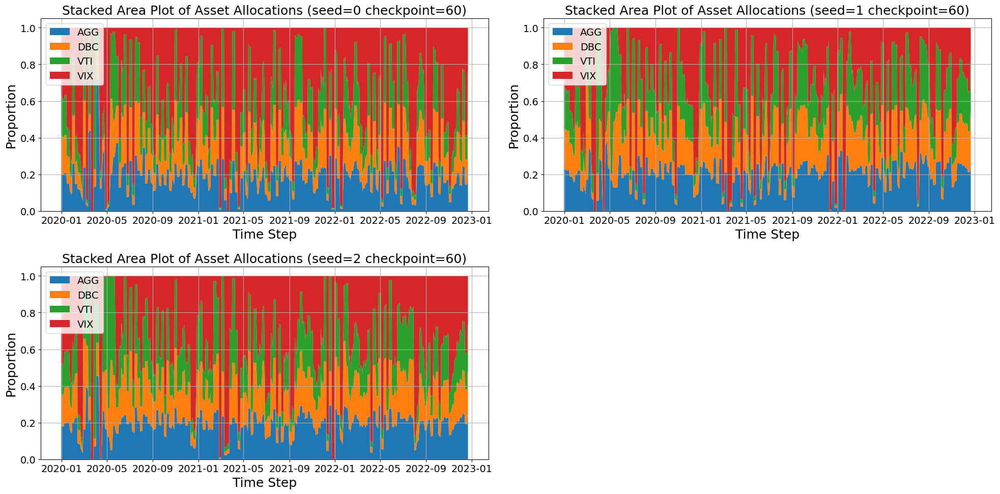

--------------------
Val RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=60,1.86,0.0567,0.483,1.07,0.00282,0.0498
seed=1 checkpoint=60,1.55,0.0558,0.517,1.12,0.00233,0.0417
seed=2 checkpoint=60,1.93,0.058,0.5,1.13,0.00276,0.0476


(626,)
(626,)
(626,)


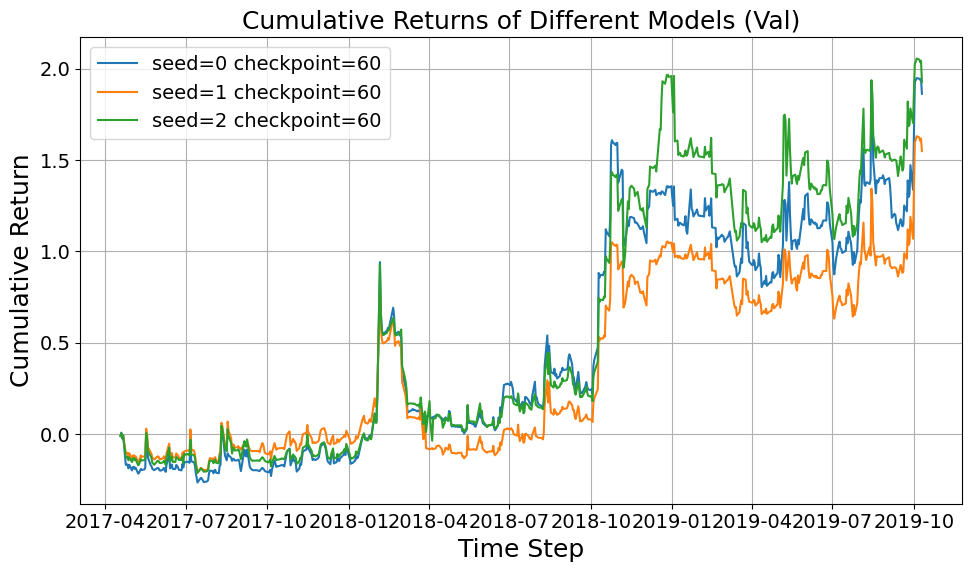

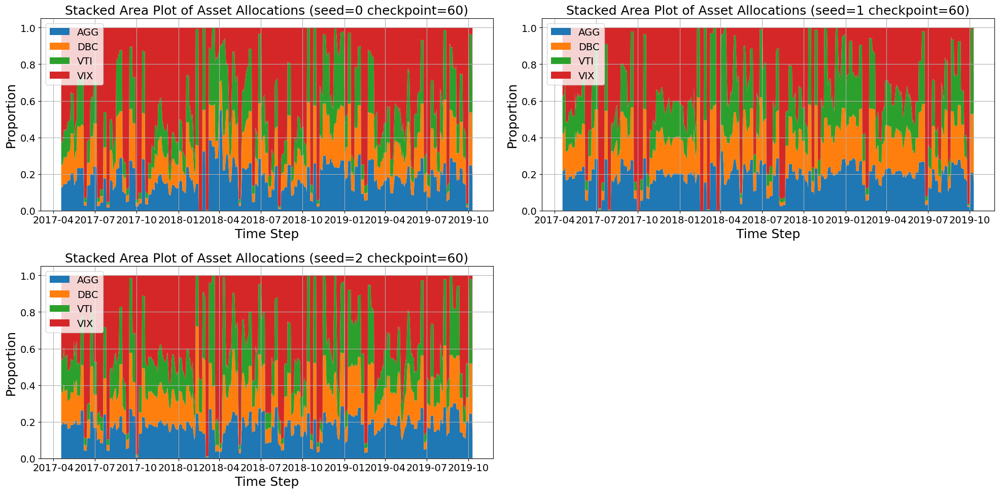

In [121]:
best_params = best_CNN_params = hyperparam_search(experiments)
filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(filtered_experiements)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

## MLP - Param Tuning

In [122]:
params_grids = [{
    "seed": [0,1,2],
    "epochs": [50],
    "lambda_entropy": [0.025],#, 0.4],#, 0.0025],#[0.0001, 0.001, 0.01, 0.025, 0.05, 0.1],
    "model": ["MLP"],
    "learning_rate": [1e-3],
    "checkpoint_freq": [5],
    "rebalance_freq": [5],
    "jitter" : [1.5]
}
]

experiment_path = "fyp3/experiments/standard_model/"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

None
[True, True, True, True, True, True, True, True, True, True]
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.025,model=MLP,learning_rate=0.001,checkpoint_freq=5,rebalance_freq=5,jitter=1.5,checkpoint=5.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.025,model=MLP,learning_rate=0.001,checkpoint_freq=5,rebalance_freq=5,jitter=1.5,checkpoint=10.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.025,model=MLP,learning_rate=0.001,checkpoint_freq=5,rebalance_freq=5,jitter=1.5,checkpoint=15.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.025,model=MLP,learning_rate=0.001,checkpoint_freq=5,rebalance_freq=5,jitter=1.5,checkpoint=20.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.025,model=MLP,learning_rate=0.001,checkpoint_freq=5,rebalance_freq=5,jitter=1.5,checkpoint=25.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=50,lambda_entropy=0.0

Hyperparam Search over seeds


,epochs,lambda_entropy,model,learning_rate,checkpoint_freq,rebalance_freq,jitter,checkpoint,mean_val_expected_return
3,50,0.025,MLP,0.001,5,5,1.5,20,1.432615
2,50,0.025,MLP,0.001,5,5,1.5,15,1.404184
4,50,0.025,MLP,0.001,5,5,1.5,25,1.403465
8,50,0.025,MLP,0.001,5,5,1.5,45,1.369467
5,50,0.025,MLP,0.001,5,5,1.5,30,1.326981
6,50,0.025,MLP,0.001,5,5,1.5,35,1.266448
1,50,0.025,MLP,0.001,5,5,1.5,10,1.252491
7,50,0.025,MLP,0.001,5,5,1.5,40,1.242393
0,50,0.025,MLP,0.001,5,5,1.5,5,1.242033
9,50,0.025,MLP,0.001,5,5,1.5,50,1.151216


/tmp/ipykernel_1610445/1405371290.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


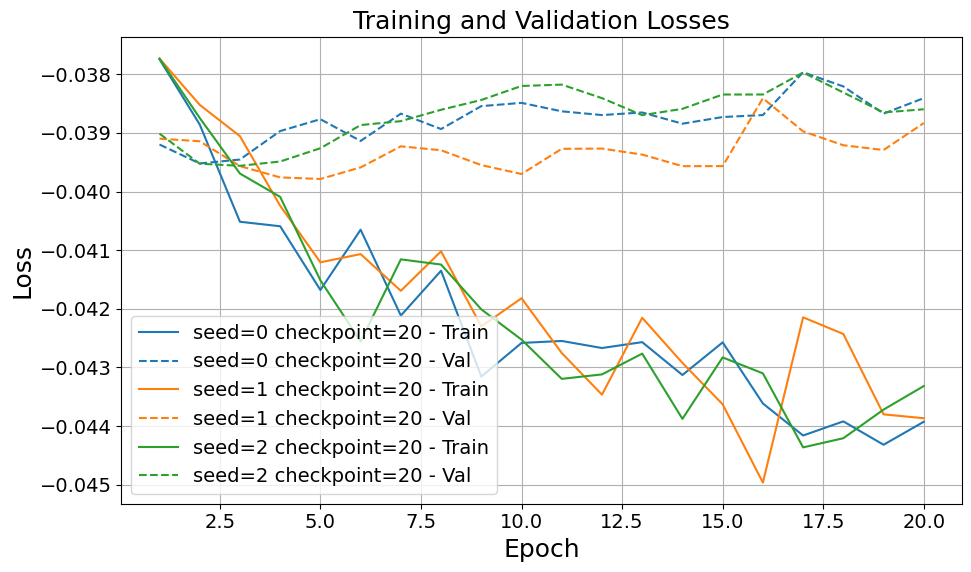

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=20,3.69,0.0775,0.369,1.27,0.00266,0.0343
seed=1 checkpoint=20,2.28,0.0647,0.351,1.27,0.00214,0.033
seed=2 checkpoint=20,2.33,0.0739,0.387,1.31,0.00197,0.0266


(752,)
(752,)
(752,)


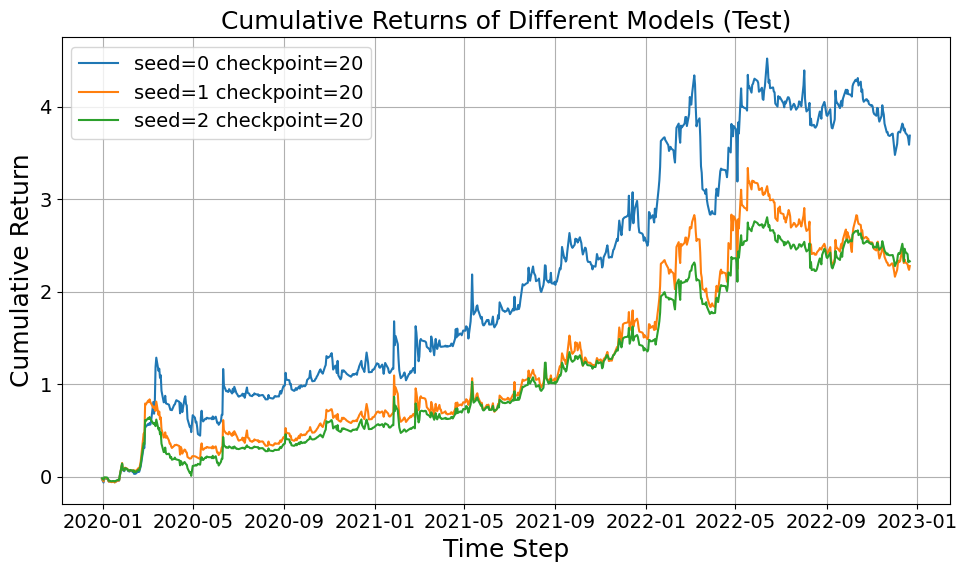

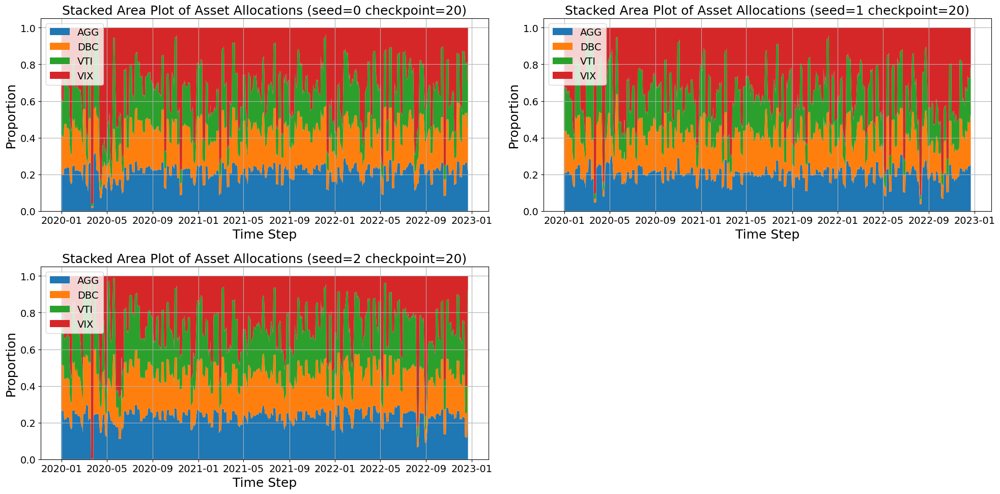

--------------------
Val RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=20,1.4,0.0586,0.217,1.31,0.00192,0.0328
seed=1 checkpoint=20,1.66,0.0601,0.255,1.29,0.0022,0.0366
seed=2 checkpoint=20,1.24,0.059,0.225,1.33,0.0017,0.0288


(626,)
(626,)
(626,)


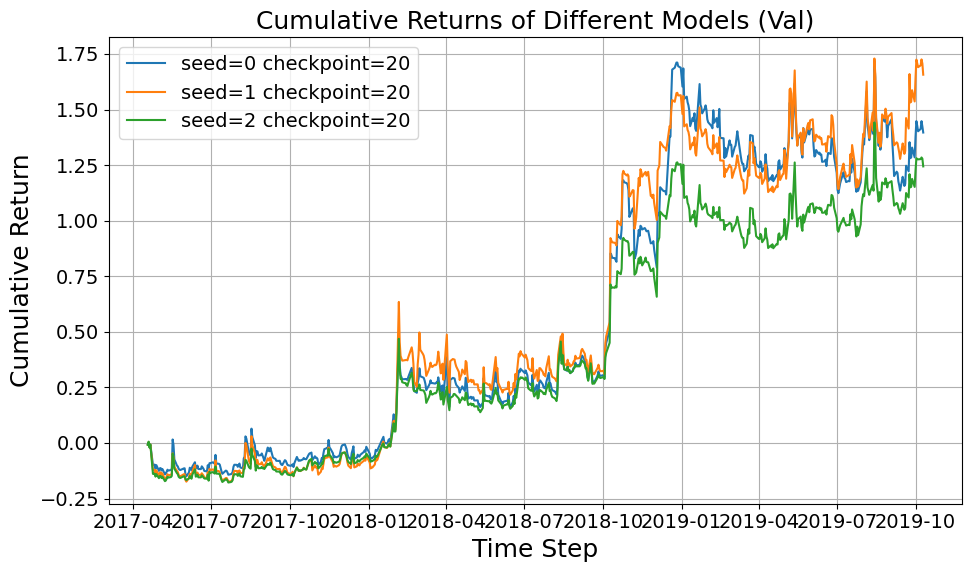

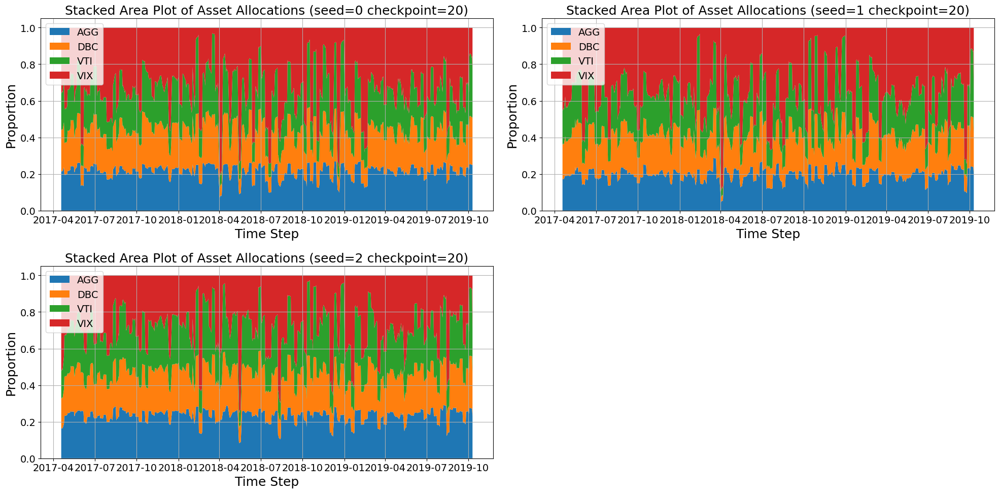

In [123]:
best_params = best_MLP_params = hyperparam_search(experiments)
filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(filtered_experiements)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

## LSTM Hyperparameter tuning

In [124]:
params_grids = [{
    "seed": [0,1,2],
    "epochs": [100],
    "lambda_entropy": [0.025],
    "model": ["LSTM"],
    "lstm_hidden_layers" : [2],
    "lstm_hidden_size": [64],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "checkpoint_freq": [10],
    "jitter" : [1],
}
]

experiment_path = "/vol/bitbucket/jlt21/experiments/standard_model"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

None
[True, True, True, True, True, True, True, True, True, True]
Loading /vol/bitbucket/jlt21/experiments/standard_model/seed=0,epochs=100,lambda_entropy=0.025,model=LSTM,lstm_hidden_layers=2,lstm_hidden_size=64,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=10,jitter=1,checkpoint=10.pth
Loading /vol/bitbucket/jlt21/experiments/standard_model/seed=0,epochs=100,lambda_entropy=0.025,model=LSTM,lstm_hidden_layers=2,lstm_hidden_size=64,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=10,jitter=1,checkpoint=20.pth
Loading /vol/bitbucket/jlt21/experiments/standard_model/seed=0,epochs=100,lambda_entropy=0.025,model=LSTM,lstm_hidden_layers=2,lstm_hidden_size=64,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=10,jitter=1,checkpoint=30.pth
Loading /vol/bitbucket/jlt21/experiments/standard_model/seed=0,epochs=100,lambda_entropy=0.025,model=LSTM,lstm_hidden_layers=2,lstm_hidden_size=64,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=10,jitter=1,checkpoint=40.pth
Loading /vol/b

Hyperparam Search over seeds


,epochs,lambda_entropy,model,lstm_hidden_layers,lstm_hidden_size,learning_rate,rebalance_freq,checkpoint_freq,jitter,checkpoint,mean_val_expected_return
8,100,0.025,LSTM,2,64,0.001,5,10,1,90,3.560098
7,100,0.025,LSTM,2,64,0.001,5,10,1,80,3.524855
6,100,0.025,LSTM,2,64,0.001,5,10,1,70,3.486939
9,100,0.025,LSTM,2,64,0.001,5,10,1,100,3.298548
5,100,0.025,LSTM,2,64,0.001,5,10,1,60,3.285846
4,100,0.025,LSTM,2,64,0.001,5,10,1,50,3.270010
3,100,0.025,LSTM,2,64,0.001,5,10,1,40,3.051105
2,100,0.025,LSTM,2,64,0.001,5,10,1,30,2.729018
1,100,0.025,LSTM,2,64,0.001,5,10,1,20,2.017095
0,100,0.025,LSTM,2,64,0.001,5,10,1,10,1.345072


/tmp/ipykernel_1610445/1405371290.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = cm.get_cmap('tab10')


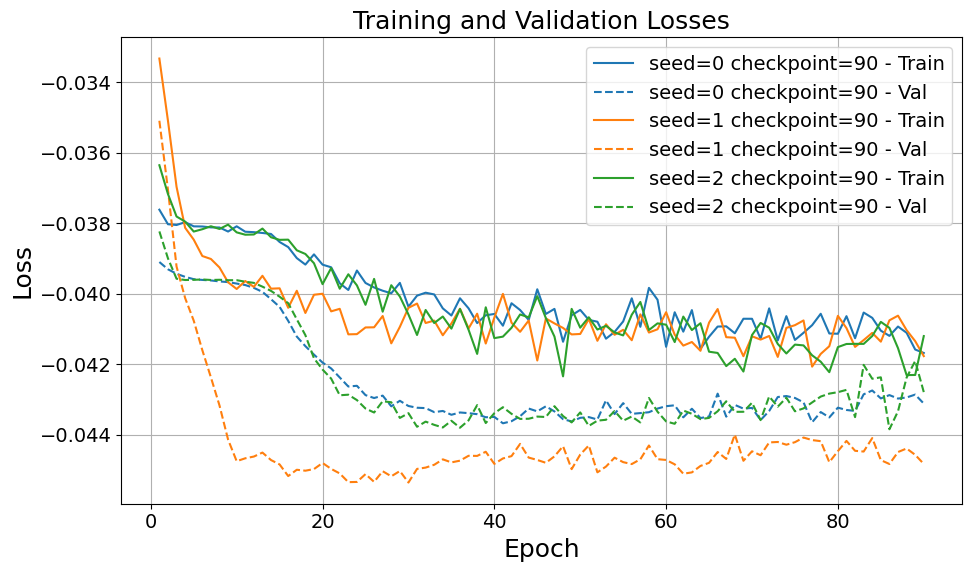

--------------------
Test RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=90,7.83,0.0917,0.32,1.22,0.00371,0.0405
seed=1 checkpoint=90,8.47,0.0948,0.339,1.22,0.00378,0.0399
seed=2 checkpoint=90,10.2,0.0939,0.323,1.16,0.00421,0.0449


(752,)
(752,)
(752,)


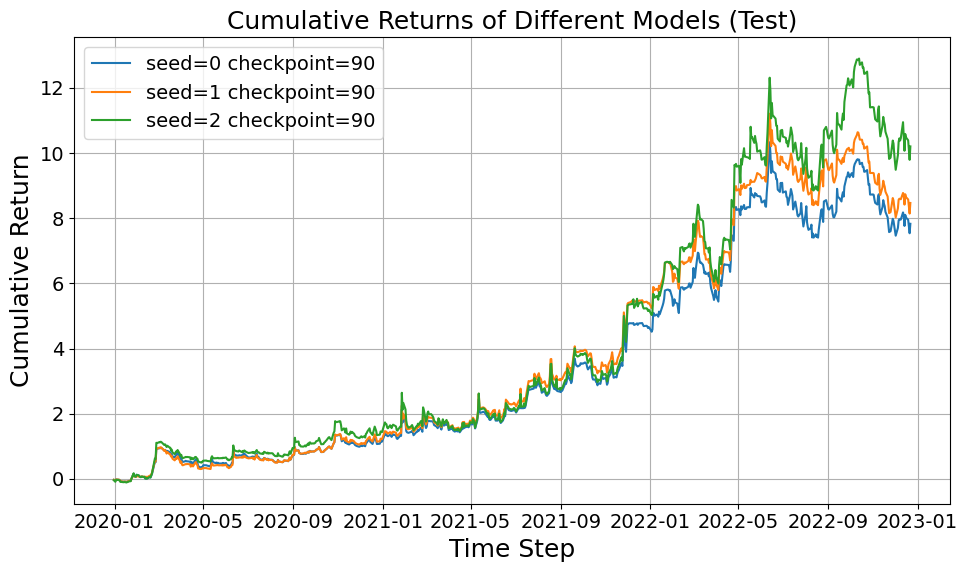

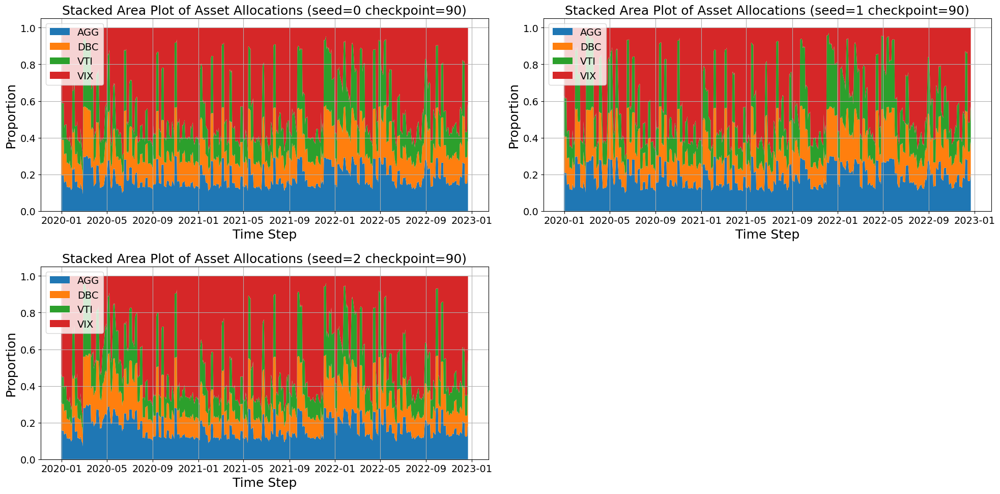

--------------------
Val RESULTS
--------------------


/tmp/ipykernel_1610445/1405371290.py:30: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_df = metrics_df.applymap(lambda x: f"{x:.3g}" if isinstance(x, float) else x)


,expected_return,sharpe_ratio,max_drawdown,mean_entropy,mean_return,std_return
seed=0 checkpoint=90,3.18,0.0728,0.267,1.19,0.00322,0.0442
seed=1 checkpoint=90,3.61,0.0784,0.263,1.18,0.00329,0.042
seed=2 checkpoint=90,3.89,0.0744,0.295,1.1,0.00374,0.0502


(626,)
(626,)
(626,)


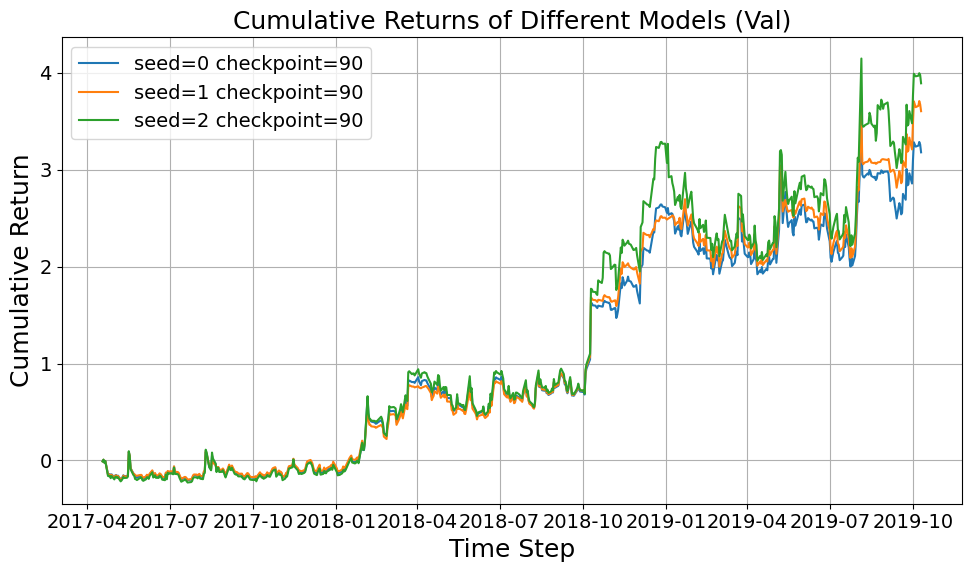

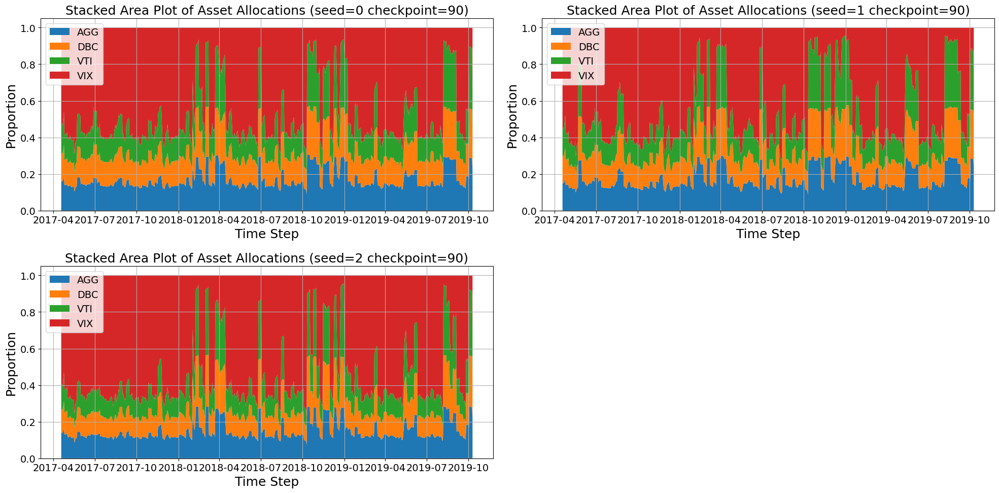

In [125]:
best_params = best_lstm_params = hyperparam_search(experiments)
filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(filtered_experiements)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

## Transformer Hyperparameter tuning



In [126]:
params_grids = [{
    "seed": [0, 1, 2],
    "epochs": [101],
    "lambda_entropy": [0.025],
    "model": ["Transformer"],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "checkpoint_freq": [4],
    "jitter": [1.5],
}
]

experiment_path = "fyp3/experiments/standard_model/"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

None
[True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True, True]
Loading fyp3/experiments/standard_model/seed=0,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=4.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=8.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=12.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=16.pth
Loading fyp3/experiments/standard_model/seed=0,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001

Epochs:   4%| | 4/101 [00:04<01:47,  1.11s/ep, train_loss=-0.03988, val_loss=-

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=4.pth


Epochs:   8%| | 8/101 [00:08<01:42,  1.10s/ep, train_loss=-0.04115, val_loss=-

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=8.pth


Epochs:  12%| | 12/101 [00:13<01:37,  1.10s/ep, train_loss=-0.04181, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=12.pth


Epochs:  16%|▏| 16/101 [00:17<01:33,  1.10s/ep, train_loss=-0.04303, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=16.pth


Epochs:  20%|▏| 20/101 [00:21<01:26,  1.07s/ep, train_loss=-0.04302, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=20.pth


Epochs:  24%|▏| 24/101 [00:26<01:22,  1.07s/ep, train_loss=-0.04512, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=24.pth


Epochs:  28%|▎| 28/101 [00:30<01:17,  1.07s/ep, train_loss=-0.04592, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=28.pth


Epochs:  32%|▎| 32/101 [00:34<01:13,  1.06s/ep, train_loss=-0.04620, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=32.pth


Epochs:  36%|▎| 36/101 [00:38<01:09,  1.07s/ep, train_loss=-0.04627, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=36.pth


Epochs:  40%|▍| 40/101 [00:43<01:05,  1.07s/ep, train_loss=-0.04711, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=40.pth


Epochs:  44%|▍| 44/101 [00:47<01:00,  1.07s/ep, train_loss=-0.04709, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=44.pth


Epochs:  48%|▍| 48/101 [00:51<00:56,  1.07s/ep, train_loss=-0.04750, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=48.pth


Epochs:  51%|▌| 52/101 [00:55<00:52,  1.06s/ep, train_loss=-0.04904, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=52.pth


Epochs:  55%|▌| 56/101 [01:00<00:47,  1.06s/ep, train_loss=-0.04967, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=56.pth


Epochs:  59%|▌| 60/101 [01:04<00:43,  1.07s/ep, train_loss=-0.05004, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=60.pth


Epochs:  63%|▋| 64/101 [01:08<00:38,  1.05s/ep, train_loss=-0.05022, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=64.pth


Epochs:  67%|▋| 68/101 [01:12<00:35,  1.07s/ep, train_loss=-0.04977, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=68.pth


Epochs:  71%|▋| 72/101 [01:16<00:30,  1.06s/ep, train_loss=-0.05107, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=72.pth


Epochs:  75%|▊| 76/101 [01:21<00:26,  1.07s/ep, train_loss=-0.05114, val_loss=

Saving seed=1,epochs=101,lambda_entropy=0.025,model=Transformer,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=4,jitter=1.5,checkpoint=76.pth


Epochs:  77%|▊| 78/101 [01:23<00:24,  1.07s/ep, train_loss=-0.04946, val_loss=


KeyboardInterrupt: 

In [ ]:
best_params = best_transformer_params = hyperparam_search(experiments)
filtered_experiements = { ek: e for ek,e in experiments.items() if all([(best_params[pk] == e["params"][pk] or pk == "seed") for pk in best_params])}
display_train_results(filtered_experiements)
for dataset_key, dataset_idx in zip(["test", "val"], [test_idx,val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(filtered_experiements, dataset_key, dataset_idx )

print(best_params)

## Comparison of models

In [ ]:
best_MLP_params

In [ ]:
best_CNN_params

In [ ]:
params_grids = [{k: [v] for k,v in ps.items()} for ps in [best_MLP_params, best_CNN_params, best_lstm_params, best_transformer_params]]


In [ ]:
for grid in params_grids:
    grid["epochs"] = grid["checkpoint"]
    del grid["checkpoint_freq"]
    del grid["checkpoint"]

In [ ]:
# best_lstm_unrolled_params = {k: v for k,v in best_lstm_params.items()}
# best_lstm_unrolled_params["model"] = "LSTM_Unrolled"
# params_grids = [{k: [v] for k,v in ps.items()} for ps in [best_MLP_params, best_CNN_params, best_lstm_params, best_transformer_params]]

experiment_path = "fyp3/experiments/standard_model/"
experiments = get_experiment_model(standard_model_fn, experiment_path, params_grids, loss_fn_fn, dataset_fn)

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)

experiments = {v["params"]["model"]: v for k,v in experiments.items()}

for dataset_key, dataset_idx in zip(["test", "val"], [test_idx, val_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

# Standard Training - Robust Analysis 

In [ ]:
from auto_LiRPA import BoundedTensor, PerturbationLpNorm,BoundedModule

In [ ]:
def bound_model(model, x, eps, method, batch_size=1):
    upper_batches = []
    lower_batches = []
    x = x.to(device)
    N = x.shape[0]


    
    if method in ["a-CROWN", "b-CROWN", "ab-CROWN", "CROWN-Optimized"]:
        bound_args = model.bound_opts["optimize_bound_args"]
        bound_args["enable_alpha_crown"] = method in ["a-CROWN", "ab-CROWN"]
        bound_args["enable_beta_crown"] = method in ["b-CROWN", "ab-CROWN"]
        method = "CROWN-Optimized"
        # print(model.bound_opts)

    if method == "CROWN-Optimized":
        model.get_split_nodes()

    out_shape = (N, 4)

    for i in tqdm(range(0, N, batch_size)):
        x_batch = x[i: i+batch_size]
        eps_vector = torch.tensor(eps, dtype=torch.float32, device=device)  # One ε per asset
        eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

        perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
        x_perturbed = BoundedTensor(x_batch, perturbation)
        try:
            lb, ub = model.compute_bounds(x=(x_perturbed,), method=method)
            lb = lb.cpu()
            ub = ub.cpu()
        except Exception as e:
            print(e)
            lb, ub = torch.tensor([torch.nan]*4).unsqueeze(0), torch.tensor([torch.nan]*4).unsqueeze(0)
             
        lower_batches.append(lb)
        upper_batches.append(ub)

        # print(lb.shape)
    # print(lower_batches)

    lower_all = torch.cat(lower_batches, 0).nan_to_num(nan=0).clamp_min(0)
    upper_all = torch.cat(upper_batches, 0).nan_to_num(nan=1).clamp_max(1)

    return lower_all, upper_all

# torch.tensor([torch.nan]*4).unsqueeze(0).shape
# 

In [ ]:
def pgd_attack(model, x_init, y, eps, loss_fn, n_steps=20, step_size=0.1, device='cuda:0'):
    # 0/0
    model.eval()
    x0 = x_init.to(device)
    y0 = y.to(device)
    eps = eps.to(device) if torch.is_tensor(eps) else eps

    # start from the clean example, one tensor that always requires grad
    adv = x0.clone().detach().requires_grad_(True)
    best_loss = torch.full((x0.size(0),), -float('inf'), device=device)
    with torch.enable_grad():
        for _ in range(n_steps):
            # zero the gradient from the previous step
            if adv.grad is not None:
                adv.grad.zero_()
            # forward + objective (we do -loss because we want the *worst* point)
            logits = model(adv)
            obj = -loss_fn(logits, y0)            # this must be a Tensor, not a float

            # keep the best‐so‐far point per example
            mask = (obj >= best_loss).view(-1, *([1] * (adv.dim()-1)))
            best_loss = torch.where(obj >= best_loss, obj.detach(), best_loss)
            # you can store best‐so‐far inputs if needed, same pattern

            # compute gradient w.r.t. adv
            obj.sum().backward()                  # builds d(obj)/d(adv)
            # PGD step: modify adv.data in‐place, then clamp
            adv.data = (adv.data + step_size * adv.grad.data.sign())
            adv.data = adv.data.clamp(x0 - eps, x0 + eps)

    # at the end, adv contains your adversarial examples
    return adv.detach()

def pgd_attack_loss(x, y):
    loss = ((1 + y).prod(1) * x).sum(1)
    return loss

In [ ]:
def get_bounded_model(experiment):
    model_type = experiment["params"]["model"]
    model = experiment["model"]

    model = model.to(device)

    beta_crown_args = {
                "enable_alpha_crown": True,   # α-CROWN
                "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
                "optimizer": "adam",          
                "iteration": 5,              # α/β optimization steps
                "lr_alpha": 0.5,
                "lr_beta": 0.05,
                "pruning_in_iteration": True
            }
    if model_type == "MLP" or model_type == "LSTM":
        bound_opts = {
                "optimize_bound_args": beta_crown_args,
        }
    else:
        bound_opts = {
                "optimize_bound_args": beta_crown_args,
                "conv_mode": "matrix"
            }
    return BoundedModule(model, X_train_tensor, bound_opts=bound_opts)

In [ ]:
def pgd_attack_experiments(experiments, x, y, test_eps, loss_fn=pgd_attack_loss):
    for model_name, experiment in experiments.items():
        if "epochs" not in experiment["params"]:
            continue
        model = experiment["model"]

        experiment["results"]["test"]["PGD"] = {}
        experiment["results"]["test"]["PGD_AdvX"]  = {}
        experiment["results"]["test"]["PGD_AdvY"]  = {}
        for eps in test_eps:
            attack_point = pgd_attack(model, x, y, eps, loss_fn)
            experiment["results"]["test"]["PGD_AdvX"][eps] = attack_point.cpu()
            experiment["results"]["test"]["PGD_AdvY"][eps] = model(attack_point).cpu()

In [ ]:
def deltas_experiments(experiments):
    for model_name, experiment in experiments.items():
        returns = experiment["results"]["test"]["returns"] 
        deltas = experiment["results"]["test"]["deltas"] = {}
        model_returns = returns["None"]

        for method, return_dict in returns.items():
            if method == "None":
                continue
            deltas[method] = {}
            for eps, ret in return_dict.items():
                deltas[method][eps] = ((ret + 1) -(model_returns+1))/ (model_returns+1)  


In [ ]:
def get_experiment_returns(experiments, y):
    for model_name, experiment in experiments.items():
        # model = experiment["model"]

        model_weights = experiment["results"]["test"]["bounds"]["None"]
        returns = experiment["results"]["test"]["returns"] = {}
        asset_returns = (y+1).prod(1)-1

        returns["None"] = (asset_returns * model_weights).sum(1)#.cpu()

        for method in experiment["results"]["test"]["bounds"].keys():


            if method == "PGD" or method =="None": #TODO delete
                continue

            # print(method)

            returns[method] = {}
            for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
                ub, lb = bounds
                # print(lb.shape, asset_returns.shape)
                returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)#.cpu()

        if "epochs" not in experiment["params"]:
            continue

        returns["PGD"] = {}

        for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
            returns["PGD"][eps] = (asset_returns * weights).sum(1)#cpu()
            # print(returns["PGD"][eps])
# get_experiment_returns(exps, y)

In [ ]:
def bound_experiments(experiments, methods, x, test_eps):
    for model_name, experiment in experiments.items():
        model = experiment["bounded_model"]
        
        if "bounds" not in experiment["results"]["test"]:
            experiment["results"]["test"]["bounds"] = {}
        experiment["results"]["test"]["bounds"]["None"] = model(x.to(device)).cpu()
        
        for method in methods:
            experiment["results"]["test"]["bounds"][method] = {}
            for eps in test_eps:
                experiment["results"]["test"]["bounds"][method][eps] = bound_model(model, x, eps, method, batch_size=1)

# bound_experiments({"mlp": mlp}, ["IBP"], x[:5], [0.001])

## Adversarial Attacks

In [ ]:
mlp = experiments["MLP"]
cnn = experiments["CNN"]
LSTM_Unrolled = experiments["LSTM_Unrolled"]
transformer = experiments["Transformer"]
lstm = experiments["LSTM"]

exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}

In [ ]:
for model_name, model in exps.items():
    model["bounded_model"] = get_bounded_model(model)

In [ ]:
test_eps = [0.1]
x = X_test_tensor[::horizon]
y = y_test_tensor[::horizon]
pgd_attack_experiments(exps, x, y, test_eps)
bound_experiments(exps, [], x, [])
get_experiment_returns(exps, y)
deltas_experiments(exps)

In [ ]:
model_names = ["CNN"]
for model_name in model_names:
    first = exps[model_names[0]]["results"]["test"]["deltas"]["PGD"]
    thresholds = sorted(first.keys())
    for eps in test_eps:
        deltas = exps[model_name]["results"]["test"]["deltas"]["PGD"][eps]
        returns = exps[model_name]["results"]["test"]["returns"]


        model_returns = returns["None"]
        pgd_returns = returns["PGD"][eps]

        model = exps[model_name]["model"]

        mask_pos_in_a = model_returns > 0       # True where 'a' is positive
        mask_neg_in_b = pgd_returns < 0       # True where 'b' is negative

        # 2) Combine them: only indices where BOTH are True
        combined_mask = mask_pos_in_a & mask_neg_in_b

        # 3) Extract the integer indices where combined_mask is True
        #    torch.nonzero(...) returns a tensor of shape (N, 1) for a 1D mask, so we .flatten() or .squeeze().
        intersection_idx = torch.nonzero(combined_mask)
        # print(intersection_idx)
        # print(model_returns[:5])
        # print(pgd_returns)
        # print(pgd_returns[:5])
        # print(deltas[intersection_idx])
        # 0/0
        


      
        # print(intersection_idx)
        # print(deltas[intersection_idx])

        test = deltas[intersection_idx]
        

        # print(torch.argmin(test))


        min_idx = torch.argmin(pgd_returns[intersection_idx])
        min_idx = intersection_idx[min_idx].cpu().detach().numpy()[0]
        # print(min_idx)
        # print(deltas[min_idx])
        print("Clean return", returns["None"][min_idx].cpu().detach().numpy())
        print("Adversarial return", returns["PGD"][eps][min_idx].cpu().detach().numpy())

    
        adv_X = exps[model_name]["results"]["test"]["PGD_AdvX"][eps]

        

        
        adv_Y = exps[model_name]["results"]["test"]["PGD_AdvY"][eps]
        deltas = exps[model_name]["results"]["test"]["deltas"]["PGD"][eps]

        model_weights = exps[model_name]["results"]["test"]["bounds"]["None"]

        data_np = X_test_tensor[::5][min_idx].numpy()
        data_np2 = adv_X[min_idx].cpu().numpy()

        time = range(data_np.shape[0])  # 0,1,…,49

        # Create a 2×2 grid of subplots
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), sharex=True)

        # Flatten the axes array for easy iteration
        axes = axes.flatten()

        for i, ax in enumerate(axes):

            print(data_np[:, i].shape)
            ax.plot(time, torch.tensor(data_np[:, i]) * saved_std[i] + saved_mean[i],  linestyle='-')
            ax.plot(time, torch.tensor(data_np2[:, i]) * saved_std[i] + saved_mean[i], linestyle='--')
            ax.set_title(f'{asset_names[i]}')
            ax.set_ylabel('Value')
            ax.grid(True, linestyle='--', alpha=0.5)

        # Label the shared x-axis on the bottom row
        for ax in axes[2:]:
            ax.set_xlabel('Time')

        # fig.suptitle(f'Tensor Data over Time (2×2 Grid) {label_from_params(eps[model_name]["params"], exps)} {eps}', y=0.95)
        plt.tight_layout()
        plt.show()


        weights_clean = model(X_test_tensor[::5][min_idx].to(device).unsqueeze(0)).cpu().detach().numpy().squeeze(0)
        weights_adv   = model(adv_X[min_idx].to(device).unsqueeze(0)).cpu().detach().numpy().squeeze(0)

        # X-axis positions for the two scenarios
        x = np.arange(2)

        # Compute cumulative bottoms for stacking
        bottom_idx0 = np.zeros(2)
        bottom_idx1 = np.zeros(2)
        bottom_idx2 = np.zeros(2)

        # Plot stacked bar chart
        plt.figure(figsize=(6, 5))

        # Index 0
        plt.bar(x,
                [weights_clean[0], weights_adv[0]],
                label=asset_names[0])

        # Index 1 on top of Index 0
        bottom_idx0 = [weights_clean[0], weights_adv[0]]
        plt.bar(x,
                [weights_clean[1], weights_adv[1]],
                bottom=bottom_idx0,
                label=asset_names[1])

        # Index 2 on top of Index 0 + Index 1
        bottom_idx1 = [weights_clean[0] + weights_clean[1],
                    weights_adv[0]   + weights_adv[1]]
        plt.bar(x,
                [weights_clean[2], weights_adv[2]],
                bottom=bottom_idx1,
                label=asset_names[2])

        # Index 3 on top of Index 0 + Index 1 + Index 2
        bottom_idx2 = [weights_clean[0] + weights_clean[1] + weights_clean[2],
                    weights_adv[0]   + weights_adv[1]   + weights_adv[2]]
        plt.bar(x,
                [weights_clean[3], weights_adv[3]],
                bottom=bottom_idx2,
                label=asset_names[3])

        # Labels, ticks, title, and legend
        plt.xticks(x, ['Clean Output', 'Adversarial Output'])
        plt.xlabel('Output Type')
        plt.ylabel('Weight Value')
        plt.title('Stacked Bar Plot: Clean vs. Adversarial Weights')
        plt.legend(title='Weight Index')
        plt.tight_layout()
        plt.show()

        

In [ ]:
exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}
# exps = {"LSTM": }
test_eps = [0.05, 0.01, 0.25, 0.1]
test_delta = [0.01, 0.025, 0.05, 0.1]
x = X_test_tensor[::horizon]
y = y_test_tensor[::horizon]
pgd_attack_experiments(exps, x, y, test_eps)
bound_experiments(exps, [], x, [])
get_experiment_returns(exps, y)
deltas_experiments(exps)

def find_counterexamples(exps, test_delta):
    counterexamples = []
    for model_name, model in exps.items():
        for e in test_eps:
            for d in test_delta:
                true_deltas = model["results"]["test"]["deltas"]["PGD"][e]
                num_counterexamples = torch.abs(true_deltas) > d
                num_examples = num_counterexamples.shape[0]
                counterexamples.append({
                    "model": model_name,
                    "epsilon": e,
                    "delta": d,
                    "counterexamples": round((float((sum(num_counterexamples)/ num_examples).cpu().detach().numpy())),2)
                })

    counterexamples_df = pd.DataFrame(counterexamples)  

    counterexamples_df = counterexamples_df.pivot(index=["epsilon", 'delta'], columns='model', values='counterexamples')
    counterexamples_df = counterexamples_df.reset_index()
    counterexamples_df.columns.name = None
    counterexamples_df

    return counterexamples_df

PGD_results_table = find_counterexamples(exps, test_delta)
print("PGD Results table")
display(PGD_results_table)

test_delta_graph = np.array(list(range(31)))/100

PGD_results_graph = find_counterexamples(exps, test_delta_graph)

for eps, df_eps in PGD_results_graph.groupby("epsilon"):
    plt.figure(figsize=(12, 8))
    for model in exps.keys():
        plt.plot(df_eps["delta"], df_eps[model], label=model)
    plt.xlabel("Test δ")
    plt.ylabel("% Counterexample")
    plt.title(f"% known adversarial examples with a reduction in returns worse than test δ for ε={eps}")
    plt.grid(True)
    plt.legend()
    plt.show()

## Verified bounds

In [ ]:
def get_robust(deltas, exps):
    robust = []
  


    for model_name, model in exps.items():

        # print(model_name)
        # print(model["results"]["test"]["deltas"])

        for method_name, method in model["results"]["test"]["deltas"].items():
            # print(method_name)
            if method_name in ["PGD", "None"]:
                continue

            # print(method)
            
            for eps, true_deltas in method.items():
                # for e in test_eps:
                    # true_deltas = model["results"]["test"]["deltas"][method][e]
                for d in deltas:
                    num_counterexamples = torch.abs(true_deltas) <= d
                    num_examples = num_counterexamples.shape[0]
                    robust.append({
                        "model": model_name,
                        "method": method_name,
                        "epsilon": eps,
                        "delta": d,
                        "robust": round((float((sum(num_counterexamples)/ num_examples).cpu().detach().numpy())),2)
                    })
    return robust

# pd.DataFrame(get_robust(table_test_delta, exps))  


### IBP

In [ ]:
x = X_test_tensor[::horizon][:30]
y = y_test_tensor[::horizon][:30]

In [ ]:
test_eps = [0.001, 0.005, 0.01]
exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}
methods = ["IBP"]
pgd_attack_experiments(exps, x, y, test_eps)
bound_experiments(exps, methods, x, test_eps)
get_experiment_returns(exps, y)
deltas_experiments(exps)

In [ ]:
table_test_delta = [0.01, 0.025, 0.05, 0.1]

df = pd.DataFrame(get_robust(table_test_delta, exps))  
df = df[df["method"] == "IBP"]
df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
df = df.reset_index()
df.columns.name = None
df

In [ ]:
graph_test_delta = np.array(list(range(31)))/100
df = pd.DataFrame(get_robust(graph_test_delta, exps))
method = "IBP"
df = df[df["method"] == method]
for eps, df_eps in df.groupby("epsilon"):
    # for method, df_eps_method in df_eps.groupby("method"):
    plt.figure()
    for model_name, df_model in df_eps.groupby("model"):
        plt.plot(df_model["delta"], df_model["robust"], label=model_name)
    plt.xlabel("Test δ")
    plt.ylabel("% Certified Robust")
    plt.title(f"Certified Robustness under {method} of models tested at ε={eps}")
    plt.grid(True)
    plt.legend()
    plt.show()

### CROWN

In [ ]:
test_eps = [0.01, 0.025, 0.05, 0.1]
exps = {"MLP": mlp, "CNN": cnn} #"LSTM TODO"#, "Transformer": transformer, "LSTM": LSTM_Unrolled}
methods = ["CROWN"]
pgd_attack_experiments(exps, x, y, test_eps)
bound_experiments(exps, methods, x, test_eps)
get_experiment_returns(exps, y)
deltas_experiments(exps)

In [ ]:
table_test_delta = [0.01, 0.025, 0.05, 0.1]
df = pd.DataFrame(get_robust(table_test_delta, {"MLP": mlp, "CNN": cnn}))  
df = df[df["method"] == "CROWN"]
df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
df = df.reset_index()
df.columns.name = None
df

In [ ]:
graph_test_delta = np.array(list(range(31)))/100
df = pd.DataFrame(get_robust(graph_test_delta, exps))

method = "CROWN"
df = df[df["method"] == method]

for eps, df_eps in df.groupby("epsilon"):
    # for method, df_eps_method in df_eps.groupby("method"):
    plt.figure()
    for model_name, df_model in df_eps.groupby("model"):
        plt.plot(df_model["delta"], df_model["robust"], label=model_name)
    plt.xlabel("Test δ")
    plt.ylabel("% Certified Robust")
    plt.title(f"Certified Robustness under {method} of models tested at ε={eps}")
    plt.grid(True)
    plt.legend()
    plt.show()

### ab-CROWN

In [ ]:
test_eps = [0.01, 0.025, 0.05, 0.1]
exps =  {"MLP": mlp, "CNN": cnn}
methods = ["ab-CROWN"]
pgd_attack_experiments(exps, x, y, test_eps)
# bound_experiments(exps, methods, x, test_eps)
get_experiment_returns(exps, y)
deltas_experiments(exps)

In [ ]:
table_test_delta = [0.01, 0.025, 0.05, 0.1]
df = pd.DataFrame(get_robust(table_test_delta, exps))  
df = df[df["method"] == "ab-CROWN"]
df = df.pivot(index=["epsilon", 'delta'], columns='model', values='robust')
df = df.reset_index()
df.columns.name = None
df

In [ ]:
graph_test_delta = np.array(list(range(61)))/240
df = pd.DataFrame(get_robust(graph_test_delta, exps))
method = "ab-CROWN"
df = df[df["method"] == method]

for eps, df_eps in df.groupby("epsilon"):
    # for method, df_eps_method in df_eps.groupby("method"):
    plt.figure(figsize=(10,6))
    for model_name, df_model in df_eps.groupby("model"):
        plt.plot(df_model["delta"], df_model["robust"], label=model_name)
    plt.xlabel("Test δ")
    plt.ylabel("% Certified Robust")
    plt.title(f"Certified Robustness under α,β-CROWN of models tested at ε={eps}")
    plt.grid(True)
    plt.legend()
    plt.show()

In [ ]:
# df_tables = pd.DataFrame(get_robust(table_test_delta))  
# for method_name, df_table in df_tables.groupby("method"):
#     display(df_table)

In [ ]:
# graph_test_delta = np.array(list(range(31)))/100
# df_graphs = pd.DataFrame(get_robust(graph_test_delta))

# for eps, df_eps in df_graphs.groupby("epsilon"):
#     for method, df_eps_method in df_eps.groupby("method"):
#         plt.figure()
#         for model_name, df_model in df_eps_method.groupby("model"):
#             plt.plot(df_model["delta"], df_model["robust"], label=model_name)
#         plt.xlabel("test_delta")
#         plt.ylabel("% Certified Robust")
#         plt.title(f"{method} {eps}")
#         plt.grid(True)
#         plt.legend()
#         plt.show()

## Runtime Analysis

In [ ]:
import time as time

In [ ]:
N = 1

exps = {"MLP": mlp, "CNN": cnn, "Transformer": transformer, "LSTM": LSTM_Unrolled}


bound_performance_path = os.path.join(experiment_path, "bound_performance8.csv")
os.makedirs(os.path.dirname(bound_performance_path), exist_ok=True)
if os.path.exists(bound_performance_path):
    with open(bound_performance_path, 'r') as file:
        bound_performance = json.load(file)
else:
    bound_performance = {}

methods = ["IBP", "PGD", "CROWN-IBP", "CROWN", "ab-CROWN"]
skip = {
    "MLP": [],
    "CNN": [],
    "Transformer": methods,#["CROWN", "CROWN-IBP", "ab-CROWN"],
    "LSTM": methods#["ab-CROWN", "CROWN"],

}


for N in [1]:
    x = X_test_tensor[:N]
    y = y_test_tensor[:N]
    N = str(N)
    if N not in bound_performance :
        bound_performance[N] = {}
    for method in methods:
        if method not in bound_performance[N] :
            bound_performance[N][method] = {}
        for model_name, model_dict in exps.items():
            if model_name in bound_performance[N][method]:
                print(f"Already tested {model_name} {method} {N}")
                continue 

            if method in skip[model_name]:
                print(f"Skipping {model_name} {method} {N}")
                continue 

            
            if ("model_bounded" not in model_dict):
                print(f"Loading bounded model for {model_name}")
                model_dict["model_bounded"] = get_bounded_model(model_dict)
            bounded_model = model_dict["model_bounded"]
            
            bounds = None
            start_time = time.time()
            if method == "PGD":
                pgd_attack(bounded_model, x.to(device), y.to(device), 0.1, pgd_attack_loss, step_size=20, device=device)
            else:
                bounds = bound_model(bounded_model, x.to(device), 0.1, method)
            time_taken = time.time() - start_time
            print(f"{model_name} {method} {N} - {time_taken}")
            mean_width = None
            if bounds is not None:     
                mean_width = torch.mean(torch.abs(bounds[1] - bounds[0]))
            bound_performance[N][method][model_name] = {"time_taken": time_taken, "mean_width": mean_width}


            print(bound_performance)
            # print(bound_performance[N][method][model_name])
            with open(bound_performance_path, 'w') as file: 
                json.dump(bound_performance, file, indent=4)

In [ ]:
import pandas as pd


# Convert to DataFrame
rows = []
for run, methods in bound_performance.items():
    for method, models in methods.items():
        for model, value in models.items():
            rows.append({
                'N': int(run),
                'method': method,
                'model': model,
                'value': value*100 / int(run)
            })

df = pd.DataFrame(rows)
df = df[df["N"] == 8]
# Aggregate value over runs (compute mean)
# agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# Pivot so that 'model' remains rows and 'method' become columns
df =  df.pivot(index=['model',"N"], columns='method', values='value').reset_index()

df

In [ ]:
import pandas as pd


# Convert to DataFrame
rows = []
for run, methods in bound_performance.items():
    for method, models in methods.items():
        for model, value in models.items():
            rows.append({
                'run#': int(run),
                'method': method,
                'model': model,
                'value': value
            })

df = pd.DataFrame(rows)

# Aggregate value over runs (compute mean)
agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# Pivot so that 'model' remains rows and 'method' become columns
pivot_df = agg_df.pivot(index='model', columns='method', values='value').reset_index()

pivot_df

In [ ]:
bounds_dict = []
for model_name, model in exps.items():
    for method in model["results"]["test"]["deltas"].keys():
        if method in ["PGD", "None"]:
            continue
        for e in model["results"]["test"]["deltas"][method].keys():
            true_deltas = model["results"]["test"]["deltas"][method][e]
            bounds = model["results"]["test"]["bounds"][method][e]

            mean_bound_width = torch.mean(torch.abs(bounds[1] - bounds[0]))
            mean_delta = torch.mean(true_deltas)

            bounds_dict.append({
                    "model": model_name,
                    "method": method,
                    "epsilon": e,
                    "mean_bound_width": round(float(mean_bound_width.cpu()),2),
                    "mean_delta": round(float(mean_delta.cpu()),2),
                })
print("Mean bound width. Mean delta")
df = pd.DataFrame(bounds_dict)  
display(df)

In [ ]:
exp = {"ml"}

In [ ]:
import time

In [ ]:
exp = experiments["seed=0,epochs=30,lambda_entropy=0.001,model=MLP,learning_rate=0.001,checkpoint_freq=3,rebalance_freq=5,checkpoint=3.pth"]
exp2 = experiments["seed=0,epochs=30,lambda_entropy=0.0025,model=CNN,learning_rate=0.001,checkpoint_freq=10,rebalance_freq=5,checkpoint=10.pth"]
exp3 = experiments["seed=0,epochs=100,lambda_entropy=0.025,model=LSTM_Unrolled,lstm_layers=4,lstm_hidden_layers=1,learning_rate=0.001,rebalance_freq=5,checkpoint_freq=8,checkpoint=64.pth"]
# device = "cpu"
bound_performance_path = os.path.join(experiment_path, "bound_performance.csv")
os.makedirs(os.path.dirname(bound_performance_path), exist_ok=True)
if os.path.exists(bound_performance_path):
    with open(bound_performance_path, 'r') as file:
        bound_performance = json.load(file)
else:
    bound_performance = {}

eps = {"mlp": exp, "cnn": exp2, "lstm": exp3}

for run in range(3):
    run = str(run)
    if run not in bound_performance:
        bound_performance[run] = {}
    for method in ["IBP", "PGD", "CROWN-IBP", "CROWN"]:
        if method not in bound_performance[run] :
            bound_performance[run][method] = {}
        for model_name, model_dict in eps.items():
            if model_name in bound_performance[run][method]:
                print(f"Already tested {model_name} {method} {run}")
                continue 
            
            if ("model_bounded" not in model_dict):
                print(f"Loading bounded model for {model_name}")
                model_dict["model_bounded"] = get_bounded_model(model_dict)
            bounded_model = model_dict["model_bounded"]

            start_time = time.time()
            if method == "PGD":
                pgd_attack(bounded_model, X_test_tensor[::horizon].to(device), y_test_tensor[::horizon].to(device), 0.1, pgd_attack_loss, step_size=20, device=device)
            else:
                bound_model(bounded_model, X_test_tensor[::horizon].to(device), 0.1, method)
            time_taken = time.time() - start_time
            print(f"{model_name} {method} {run} - {time_taken}")

            bound_performance[run][method][model_name] = time_taken
            with open(bound_performance_path, 'w') as file: 
                json.dump(bound_performance, file, indent=4)


In [ ]:
import pandas as pd


# Convert to DataFrame
rows = []
for run, methods in bound_performance.items():
    for method, models in methods.items():
        for model, value in models.items():
            rows.append({
                'run#': int(run),
                'method': method,
                'model': model,
                'value': value
            })

df = pd.DataFrame(rows)

# Aggregate value over runs (compute mean)
agg_df = df.groupby(['method', 'model'], as_index=False)['value'].mean()

# Pivot so that 'model' remains rows and 'method' become columns
pivot_df = agg_df.pivot(index='model', columns='method', values='value').reset_index()

pivot_df

In [ ]:
# def loss_fn_fn(params):
#     lambda_entropy = params["lambda_entropy"]
#     def loss_fn(x, y, model):
#         weights = model(x)

#         asset_returns = ((1 + y).prod(1)-1)
#         portfolio_returns = (asset_returns*weights).sum(1)
#         natural_loss = -portfolio_returns.mean() 
#         clamped_weights = weights.clamp(min=1e-8)
#         entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())
#         return natural_loss -  entropy_loss
#     return loss_fn 
    
# def model_fn(params):
#     if params["model"] == "CNN":
#         model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"]).to(device)
#     else:
#         model = SimpleAssetAllocationModel(4*lookback)

#     return model

# params_grids = [{
#     "seed": [0],
#     "epochs": [10, 20, 30],
#     "lambda_entropy": [1e-4, 1e-3, 1e-2, 0.05, 0.1],
#     "model": ["CNN"],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
# },
# ]

# experiment_path = "fyp3/experiments/standard_model/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["val"] = run_experiment(model, (X_val_tensor, y_val_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "val", "train",], [test_idx, val_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:

def loss_fn_fn(params):
    lambda_risk = 1.5
    lambda_entropy = params["lambda_entropy"]


    def loss_fn(x, y, model):
        weights_ = model(x)
        
        weights = weights_.unsqueeze(1).repeat(1, horizon, 1)

        portfolio_returns = (weights * y).sum(1).sum(1)

        natural_loss = -portfolio_returns.mean() 

        clamped_weights = weights.clamp(min=1e-8)
        entropy_loss = lambda_entropy * (-(clamped_weights * clamped_weights.log()).sum(dim=1).mean())

        return natural_loss -  entropy_loss
    return loss_fn
    

def model_fn(params):
    if params["model"] == "CNN":
        model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"]).to(device)
    else:
        model = SimpleAssetAllocationModel(4*lookback)

    return model

params_grids = [{
    "seed": [441],
    "epochs": [10],
    "lambda_entropy": [1e-4, 1e-3, 1e-2, 0.05, 0.1, 0.5, 1.0],
    # "lambda_entropy": [0.0],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
},
]

experiment_path = "fyp3/experiments/standard_model/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:
params_grids = [{
    "seed": [441,2,3],
    "epochs": [10, 20, 30],
    "lambda_entropy": [1e-2],
    "model": ["CNN"],
    "dropout": [0.1, 0],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
},
]

experiment_path = "fyp2/experiments/standard_model/"

experiments = get_experiment_model(model_fn, experiment_path, params_grids, loss_fn_fn)
experiments["Uniform Baseline"] = {"model": UniformModel(), "params": {"label": "Uniform Baseline"}, "results": {}}


for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx )

# Robust Analysis (old)

In [ ]:
# def model_fn(params):
#     if params["model"] == "CNN":
#         model = CNNAllocatorCausal(4, lookback, dropout_rate=params["dropout"])
#         bound_opts = {
#             "optimize_bound_args": {
#                 "enable_alpha_crown": True,   # α-CROWN
#                 "enable_beta_crown": True,    # β-CROWN (branch-and-bound)
#                 "optimizer": "adam",          
#                 "iteration": 5,              # α/β optimization steps
#                 "lr_alpha": 0.5,
#                 "lr_beta": 0.05,
#                 "pruning_in_iteration": True
#             },
#             "verbose":True,
#             "conv_mode": "matrix"
#         }
#         model = BoundedModule(model.to(device), X_train_tensor.to(device), bound_opts=bound_opts).to(device)

#     else:
#         model = SimpleAssetAllocationModel(4*lookback) 
#         model = BoundedModule(model, X_train_tensor).to(device)
        
#     return model


# params_grids = [{
#     "seed": [0],
#     "epochs": [10, 20],
#     "model": ["CNN"],
#     "alpha": [0.5],
#     "robust_eps": [0.0005],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["CROWN-IBP"],
#     "lambda_entropy": [0.025]
# },
# {
#     "seed": [0],
#     "epochs": [10],
#     "model": ["CNN"],
#     "alpha": [0],
#     "robust_eps": [0.0000],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "loss": ["Standard"],
#     "lambda_entropy": [0.025]
# },
# ]

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx )

In [ ]:
# def bound_model(model, x, eps, method, batch_size=1):
#     upper_batches = []
#     lower_batches = []
#     x = x.to(device)
#     N = x.shape[0]

#     if method == "CROWN-Optimized":
#         model.get_split_nodes()

#     out_shape = (N, 4)

#     for i in tqdm(range(0, N, batch_size)):
#         x_batch = x[i: i+batch_size]
#         eps_vector = torch.tensor(eps, dtype=torch.float32, device=device)  # One ε per asset
#         eps_tensor = eps_vector.view(1, 1, -1).expand_as(x_batch) 

#         perturbation = PerturbationLpNorm(norm=np.inf, eps=eps_tensor)
#         x_perturbed = BoundedTensor(x_batch, perturbation)
#         lb, ub = model.compute_bounds(x=(x_perturbed,), method=method)
#         lower_batches.append(lb.to(device))
#         upper_batches.append(ub.to(device))

#     lb_out = torch.zeros(out_shape, device=device)
#     ub_out = torch.ones(out_shape, device=device)

#     lower_all = torch.cat(lower_batches, dim=0)
#     upper_all = torch.cat(upper_batches, dim=0)

#     lower_all = torch.max(lower_all, lb_out)
#     upper_all = torch.min(upper_all, ub_out)

#     return lower_all, upper_all

In [ ]:

# def loss_fn(x, y):
#     loss = ((1 + y).prod(1) * x).sum(1)
#     return loss

In [ ]:
# test_period = 20
# test_eps = [1/100, 1/200]


In [ ]:
# eps_tensor = torch.tensor(e, dtype=torch.float32, device=device)

In [ ]:
# def bound_experiments(experiments, methods, x, test_eps):
#     for model_name, experiment in experiments.items():
#         model = experiment["model"]
        
#         experiment["results"]["test"]["bounds"] = {}
#         experiment["results"]["test"]["bounds"]["None"] = model(x)
        
#         for method in methods:
#             experiment["results"]["test"]["bounds"][method] = {}
#             for eps in test_eps:
#                 print(f"{method} {eps}")
#                 experiment["results"]["test"]["bounds"][method][eps] = bound_model(model, x, eps_tensor * eps, method, batch_size=1)

In [ ]:
# def pgd_attack_experiments(experiments, x, y, test_eps):
#     for model_name, experiment in experiments.items():
#         if "epochs" not in experiment["params"]:
#             continue
#         model = experiment["model"]

#         experiment["results"]["test"]["PGD"] = {}
#         experiment["results"]["test"]["PGD_AdvX"]  = {}
#         experiment["results"]["test"]["PGD_AdvY"]  = {}
#         for eps in test_eps:
#             attack_point = pgd_attack(model, x, y, (eps * eps_tensor), loss_fn)
#             experiment["results"]["test"]["PGD_AdvX"][eps] = attack_point
#             experiment["results"]["test"]["PGD_AdvY"][eps] = model(attack_point)

In [ ]:
# test_period = 10
# test_eps = [1/200, 1/500, 1/1000]
# x = X_test_tensor[::horizon].to(device)
# y = y_test_tensor[::horizon].to(device)
# pgd_attack_experiments(experiments, x, y, test_eps)

In [ ]:
# bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)

In [ ]:
# def get_experiment_returns(experiments, y):
#     for model_name, experiment in experiments.items():
#         model = experiment["model"]

#         model_weights = experiment["results"]["test"]["bounds"]["None"].to(device)
#         returns = experiment["results"]["test"]["returns"] = {}
#         asset_returns = (y+1).prod(1)-1

#         returns["None"] = (asset_returns * model_weights).sum(1)

#         for method in ["IBP", "CROWN"]:
#             returns[method] = {}
#             for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
#                 ub, lb = bounds
#                 returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)

#         if "epochs" not in experiment["params"]:
#             continue

#         returns["PGD"] = {}

#         for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
#             returns["PGD"][eps] = (asset_returns * weights).sum(1)
#             # print(returns["PGD"][eps])

In [ ]:
# get_experiment_returns(experiments, y)

In [ ]:
# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     y = y_test_tensor[::5][:test_period]

#     model_weights = experiment["results"]["test"]["bounds"]["None"]
#     returns = experiment["results"]["test"]["returns"] = {}
#     asset_returns = (y+1).prod(1)-1

#     returns["None"] = (asset_returns * model_weights).sum(1)

#     for method in ["IBP", "CROWN"]:
#         returns[method] = {}
#         for eps, bounds in experiment["results"]["test"]["bounds"][method].items():
#             ub, lb = bounds
#             returns[method][eps] = torch.min(asset_returns * lb, asset_returns * ub).sum(1)

#     if "epochs" not in experiment["params"]:
#         continue

#     returns["PGD"] = {}

#     for eps, weights in experiment["results"]["test"]["PGD_AdvY"].items():
#         returns["PGD"][eps] = (asset_returns * weights).sum(1)
#         print(returns["PGD"][eps])
        

In [ ]:
# def deltas_experiments(experiments):
#     for model_name, experiment in experiments.items():
#         returns = experiment["results"]["test"]["returns"] 
#         deltas = experiment["results"]["test"]["deltas"] = {}
#         model_returns = returns["None"]

#         for method, return_dict in returns.items():
#             if method == "None":
#                 continue
#             deltas[method] = {}
#             for eps, ret in return_dict.items():
#                 deltas[method][eps] = ((ret + 1) -(model_returns+1))/ (model_returns+1)  

# deltas_experiments(experiments)

In [ ]:
# model_names = list(experiments.keys())
# model_names.remove("Uniform Baseline")
# model_names

In [ ]:
# experiments.keys()

# experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

In [ ]:

# def box_plot_experiment(experiments, method):
#     model_names = list(experiments.keys())
#     first = experiments[model_names[0]]["results"]["test"]["deltas"][method]
#     thresholds = sorted(first.keys())
#     n_thresh = len(thresholds)
#     model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

#     # prepare figure
#     fig, ax = plt.subplots(figsize=(12,6))
    
#     # width of each box, total span = width * n_models
#     n_models = len(model_names)
#     width = 0.8 / n_models
#     ind = np.arange(n_thresh)
    
#     # define a color cycle or list here if you like
#     colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
    
#     # plot each model
#     box_handles = []
#     for i, model_name in enumerate(model_names):
#         data = experiments[model_name]["results"]["test"]["deltas"][method]

#         vals = [data[t].detach().cpu() for t in thresholds]
        
#         pos = ind - 0.4 + width*(i + 0.5)
#         b = ax.boxplot(
#             vals,
#             positions=pos,
#             widths=width,
#             patch_artist=True,
#             boxprops=dict(facecolor=colors[i % len(colors)], alpha=0.6),
#             medianprops=dict(color='black'),
#             manage_ticks=False
#         )
#         # grab one of the boxes for the legend
#         box_handles.append(b["boxes"][0])
    
#     # labels & legend
#     ax.set_xticks(ind)
#     ax.set_xticklabels([str(t) for t in thresholds])
#     ax.set_xlabel('Threshold')
#     ax.set_ylabel('Max change in returns')
#     ax.set_title(f'Model Comparison at Different Thresholds ({method})')
#     ax.legend(box_handles, model_labels, loc='upper left')
    
#     plt.tight_layout()
#     plt.show()

# for method in ["IBP", "CROWN", "PGD"]:
#     box_plot_experiment(experiments_to_display, method)

In [ ]:
# def plot_experiment_delta_returns_vs_epsilon(experiments):
#     model_names = list(experiments.keys())
#     fig, ax = plt.subplots(figsize=(12, 6))
#     first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
#     thresholds = sorted(first.keys())
#     model_labels = ["CROWN", "IBP", "PGD"]

#     for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
#         crown_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()) for eps in thresholds]
#         IBP_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

#         # print(experiments[model_name]["results"]["test"]["deltas"]["PGD"].keys(), thresholds)
#         PGD_bounds = [torch.mean(experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
#         plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} CROWN")
#         plt.plot(thresholds, IBP_bounds, color = colors(i),  linestyle='dashdot', label=f"{model_label} IBP")
#         plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} PGD")
#     plt.xlabel('Epsilon')
#     plt.legend()
#     plt.ylabel('Delta Returns')
#     plt.show()

# plot_experiment_delta_returns_vs_epsilon(experiments_to_display)

In [ ]:
# def plot_experiment_delta_returns_vs_time(experiments, model_labels, max_points=30):
#     model_names = list(experiments.keys())
#     first = experiments[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
#     thresholds = sorted(first.keys())

#     for eps in thresholds:
#         fig, ax = plt.subplots(figsize=(12, 6))
#         #   model_labels = [label_from_params(experiments[m]["params"], experiments) for m in model_names]

#         for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
#             #     print(model_label)
#                 data = experiments[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()[:max_points]
                
#                 ax.plot(data, '-', label=f'{model_label} Verified Bound', color = colors(i))

#                 data = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()[:max_points]
#                 ax.plot(data, '--', label=f'{model_label} Adverserial Attack', alpha=0.5, color = colors(i))

#         ax.set_xlabel('Date')
#         ax.set_ylabel('Max change in returns')
#         ax.set_title(f'Model Comparison Over Time {eps} {method}')
#         ax.legend(loc='best')
#         ax.grid(True)
#         ax.set_yscale('symlog', linthresh=0.001, base=10)


#         plt.tight_layout()
#         plt.show()

# plot_experiment_delta_returns_vs_time(experiments_to_display, ["Robust Model", "Standard Model"])

In [ ]:
# def plot attack ###
# for model_name in model_names:
#     first = experiments[model_names[0]]["results"]["test"]["deltas"]["PGD"]
#     thresholds = sorted(first.keys())
#     for eps in [0.002]:
#         deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

#         min_idx = torch.argmin(deltas)


#         adv_X = experiments[model_name]["results"]["test"]["PGD_AdvX"][eps]
#         adv_Y = experiments[model_name]["results"]["test"]["PGD_AdvY"][eps]
#         deltas = experiments[model_name]["results"]["test"]["deltas"]["PGD"][eps]

#         model_weights = experiments[model_name]["results"]["test"]["bounds"]["None"]

#         data_np = X_test_tensor[::5][min_idx].numpy()
#         data_np2 = adv_X[min_idx].cpu().numpy()

#         time = range(data_np.shape[0])  # 0,1,…,49

#         # Create a 2×2 grid of subplots
#         fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 8), sharex=True)

#         # Flatten the axes array for easy iteration
#         axes = axes.flatten()

#         for i, ax in enumerate(axes):
#             ax.plot(time, data_np[:, i], marker='o', linestyle='-')
#             ax.plot(time, data_np2[:, i], marker='o', linestyle='-')
#             ax.set_title(f'{asset_names[i]}')
#             ax.set_ylabel('Value')
#             ax.grid(True, linestyle='--', alpha=0.5)

#         # Label the shared x-axis on the bottom row
#         for ax in axes[2:]:
#             ax.set_xlabel('Time')

#         fig.suptitle(f'Tensor Data over Time (2×2 Grid) {label_from_params(experiments[model_name]["params"], experiments)} {eps}', y=0.95)
#         plt.tight_layout()
#         plt.show()

# Robust Training

In [ ]:
from tqdm import tqdm

In [ ]:
standard_param_grid = [{
    "seed": [44, 1,2],
    "epochs": [10],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["Standard"]
}]
robust_eps = [0.001, 0.0005, 0.0001, 0.00001, 0.00001, 0.00005, 0.000001]

In [ ]:
params_grids = standard_param_grid 

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

In [ ]:
def linestyle_map(params):
    if "robust_eps" in params:
        return "-"
    else:
        return "--"

### IBP

In [ ]:
IBP_param_grid = [
{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": robust_eps,
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["IBP"],
}
]

params_grids = standard_param_grid + IBP_param_grid

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

### CROWN-IBP

In [ ]:
robust_eps2 = [0.001, 0.0005, 0.0001, 0.00001, 0.00001, 0.000001]

CROWN_IBP_param_grid =[
{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.5],
    "robust_eps": robust_eps2,
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["CROWN-IBP"],
}
]

params_grids = CROWN_IBP_param_grid

params_grids += [{
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["Standard"]
}]


def labeler(params, _):
    if "robust_eps" in params:
        return f"Robust Model (train eps={params['robust_eps']})"
    elif "epochs" in params:
        return "Standard Model"
    else:
        return "Uniform Baseline"
    
experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    if dataset_key == "train":
        continue
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx, linestyle_map, labeler)

In [ ]:
test_eps = [0.001, 0.002, 0.003, 0.004, 0.005]
test_period = 100
x = X_test_tensor[::horizon].to(device)[:test_period]
y = y_test_tensor[::horizon].to(device)[:test_period]
pgd_attack_experiments(experiments, x, y, test_eps)
bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)
get_experiment_returns(experiments, y)
deltas_experiments(experiments)

In [ ]:
len(experiments_to_display.keys())

In [ ]:
experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

model_names = list(experiments_to_display.keys())
fig, ax = plt.subplots(figsize=(12, 8))
first = experiments_to_display[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
thresholds = sorted(first.keys())

def labeler(params):
    if "robust_eps" in params:
        return f"Robust Model (train eps={params['robust_eps']})"
    elif "epochs" in params:
        return "Standard Model"
    else:
        return "Uniform Baseline"

model_labels = [labeler(exp["params"]) for exp in experiments_to_display.values()]

for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):
    crown_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["CROWN"][eps].cpu()) for eps in thresholds]
    IBP_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

    PGD_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
    plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} Verified Bound")
    plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} Worst PGD Attack")
plt.xlabel('Test Epsilon')
plt.legend()
plt.title("Mean Delta Returns By Test Epsilon (Test Data)")
plt.ylabel('Mean Delta Return')
plt.show()

In [ ]:
experiments_to_display = {k: experiments[k] for k in experiments.keys() if k != "Uniform Baseline"}

model_names = list(experiments_to_display.keys())
fig, ax = plt.subplots(figsize=(16, 10))
first = experiments_to_display[model_names[0]]["results"]["test"]["deltas"]["CROWN"]
thresholds = sorted(first.keys())

def labeler(params):
    if "robust_eps" in params:
        return f"Robust Model (train eps={params['robust_eps']})"
    else:
        return "Standard Model"

model_labels = [labeler(exp["params"]) for exp in experiments_to_display.values()]

for i, (model_name, model_label) in enumerate(zip(model_names, model_labels)):

    # print([experiments_to_display[model_name]["results"]["test"]["metrics"].keys() for eps in thresholds])
    crown_bounds = [experiments_to_display[model_name]["results"]["test"]["metrics"]["expected_return"] for eps in thresholds]
    # IBP_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["IBP"][eps].cpu()) for eps in thresholds]

    # PGD_bounds = [torch.mean(experiments_to_display[model_name]["results"]["test"]["deltas"]["PGD"][eps].cpu()) for eps in thresholds]
    plt.plot(thresholds, crown_bounds, color = colors(i), linestyle='-', label=f"{model_label} Verified Bound")
    # plt.plot(thresholds, PGD_bounds, color = colors(i),  linestyle='dotted', alpha=0.7, label=f"{model_label} Worst PGD Attack")
plt.xlabel('Test Epsilon')
plt.legend()
plt.ylabel('Maximum Delta Returns')
plt.show()

### MLT-IBP

In [ ]:
MTL_IBP_param_grids = [
    {
    "seed": [3],
    "epochs": [10],
    "model": ["CNN"],
    "alpha": [0.25, 0.5, 0.75],
    "robust_eps": robust_eps,
    "dropout": [0.1],
    "learning_rate": [1e-3],
    "rebalance_freq": [5],
    "lambda_entropy": [0.025],
    "loss": ["MTL-IBP"],
}
]

params_grids = standard_param_grid + MTL_IBP_param_grids

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

display_train_results(experiments)
for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
    print("-"*20)
    print(dataset_key.capitalize() + " RESULTS")
    print("-"*20)
    display_experiment_results(experiments, dataset_key, dataset_idx)

### CC-IBP

In [ ]:
# CC_IBP_param_grids = [
#     {
#     "seed": [3],
#     "epochs": [10],
#     "model": ["CNN"],
#     "alpha": [0.05],#[0, 0.25, 0.5, 0.75, 1],
#     "robust_eps": [0.00001],#[0.00001, 0.000005],
#     "dropout": [0.1],
#     "learning_rate": [1e-3],
#     "rebalance_freq": [5],
#     "lambda_entropy": [0.025],
#     "loss": ["CC-IBP"],
# }
# ]

# params_grids = standard_param_grid + CC_IBP_param_grids

# experiment_path = "fyp3/experiments/robust_models2/"
# experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
# experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

# for model_name, experiment in experiments.items():
#     model = experiment["model"]
#     experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
#     experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)

# display_train_results(experiments)
# for dataset_key, dataset_idx in zip(["test", "train"], [test_idx, train_idx]):
#     print("-"*20)
#     print(dataset_key.capitalize() + " RESULTS")
#     print("-"*20)
#     display_experiment_results(experiments, dataset_key, dataset_idx)

## Model Comparison

In [ ]:
params_grids = standard_param_grid + IBP_param_grid + CROWN_IBP_param_grid + MTL_IBP_param_grids

experiment_path = "fyp3/experiments/robust_models2/"
experiments = get_experiment_model(model_fn, experiment_path, params_grids, robust_loss_fn_fn)
experiments["Uniform Baseline"] = {"model": BoundedModule(UniformModel(), X_train_tensor), "params": {"label": "Uniform Baseline"}, "results": {}}

In [ ]:
for model_name, experiment in experiments.items():
    model = experiment["model"]
    experiment["results"]["train"] = run_experiment(model, (X_train_tensor, y_train_tensor[:, 0:1, :].squeeze(1)), experiment)
    experiment["results"]["test"] = run_experiment(model, (X_test_tensor, y_test_tensor[:, 0:1, :].squeeze(1)), experiment)


In [ ]:
# test_period = 10
test_eps = [1/500]
x = X_test_tensor[::horizon].to(device)[:test_period]
y = y_test_tensor[::horizon].to(device)[:test_period]
pgd_attack_experiments(experiments, x, y, test_eps)
bound_experiments(experiments, ["IBP", "CROWN"], x ,test_eps)
get_experiment_returns(experiments, y)
deltas_experiments(experiments)

In [ ]:
filtered_experiements = [
    # {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "Standard"},
    {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "IBP"},
    {k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "CROWN-IBP"}   
]

for alpha in [0.25, 0.5, 0.75]:
    filtered_experiements.append({k: experiments[k] for k in experiments.keys() if "loss" in experiments[k]["params"] and experiments[k]["params"]["loss"] == "MTL-IBP" and experiments[k]["params"]["alpha"] == alpha})

model_names = ["IBP", "CROWN-IBP", "MTL-IBP α=0.25", "MTL-IBP α=0.5", "MTL-IBP α=0.75"]

In [ ]:
for metric in ["mean_return", "shape", "max_drawdown", "mean_entropy"]:
    plt.figure()
    for name, fs in zip(model_names, filtered_experiements):
        eps = [exp["params"]["robust_eps"] for exp in fs.values()]
        e_return = [exp["results"]["test"]["metrics"][metric] for exp in fs.values()]
        pairs = sorted(zip(eps, e_return), key=lambda x: x[0])
        eps, e_return =  zip(*pairs)
        plt.plot(eps, e_return, label = name)
    plt.title(metric)
    plt.xlabel("Train ε")
    plt.ylabel("Mean Test Return")
    plt.legend()
    plt.show()

In [ ]:
for metric in ["CROWN", "PGD"]:
    models = ["CROWN-IBP", "IBP"]
    plt.figure()
    for name, fs in zip(model_names, filtered_experiements):
        eps = [exp["params"]["robust_eps"] for exp in fs.values()]

        e_return = [torch.mean(exp["results"]["test"]["deltas"]["CROWN"][0.002].cpu()) for exp in fs.values()]#[exp["results"]["test"]["metrics"][metric] for exp in filtered_experiements.values()]
        pairs = sorted(zip(eps, e_return), key=lambda x: x[0])
        eps, e_return =  zip(*pairs)
        plt.plot(eps, e_return, label = name)
    plt.title(metric)
    plt.xlabel("Train ε")
    plt.ylabel("Worst Return")
    plt.legend()
    plt.show()

In [ ]:
# As train eps increaes, how does it affect the expected returns under CROWN?
# As train-eps increase, how does it affect the deltas
# Treat each alpha sepererately for the blended pgd-ibp
# Then is that MVP done?

# Email updates !!!
# Draft email
# Datasets
# Loss functions
# Standard model
# Checking Robustness 
# Comparision of models

